In [2]:
pip install pandas pyarrow


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Library
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Membaca dataset Neris_20110810 dari file parquet
df_Neris_20110810 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\1-Neris-20110810.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Neris_20110810.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1621173 entries, 0 to 1621172
Data columns (total 11 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   dur        1621173 non-null  float32 
 1   proto      1621173 non-null  category
 2   dir        1621173 non-null  category
 3   state      1621172 non-null  category
 4   stos       1616028 non-null  float32 
 5   dtos       1529939 non-null  float32 
 6   tot_pkts   1621173 non-null  int32   
 7   tot_bytes  1621173 non-null  int64   
 8   src_bytes  1621173 non-null  int64   
 9   label      1621173 non-null  category
 10  Family     1621173 non-null  category
dtypes: category(5), float32(3), int32(1), int64(2)
memory usage: 58.8 MB


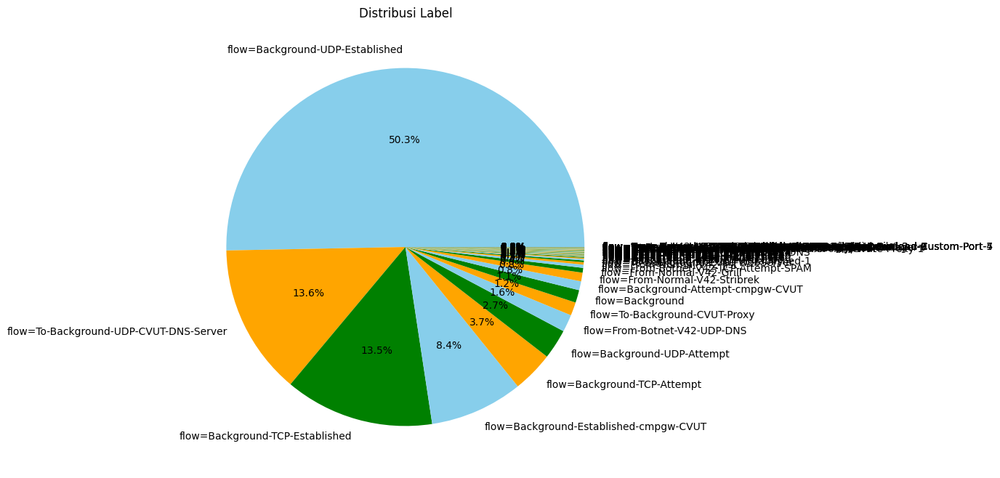

Deskripsi Distribusi Label:
flow=Background-UDP-Established                                            815604
flow=To-Background-UDP-CVUT-DNS-Server                                     220506
flow=Background-TCP-Established                                            218569
flow=Background-Established-cmpgw-CVUT                                     136333
flow=Background-TCP-Attempt                                                 60097
                                                                            ...  
flow=From-Botnet-V42-TCP-HTTP-Not-Encrypted-Down-2                              1
flow=From-Botnet-V42-TCP-Established-HTTP-Ad-60                                 1
flow=From-Botnet-V42-TCP-Established-HTTP-Binary-Download-Custom-Port-5         1
flow=From-Botnet-V42-ICMP                                                       1
flow=From-Botnet-V42-TCP-Established-HTTP-Adobe-4                               1
Name: label, Length: 113, dtype: int64


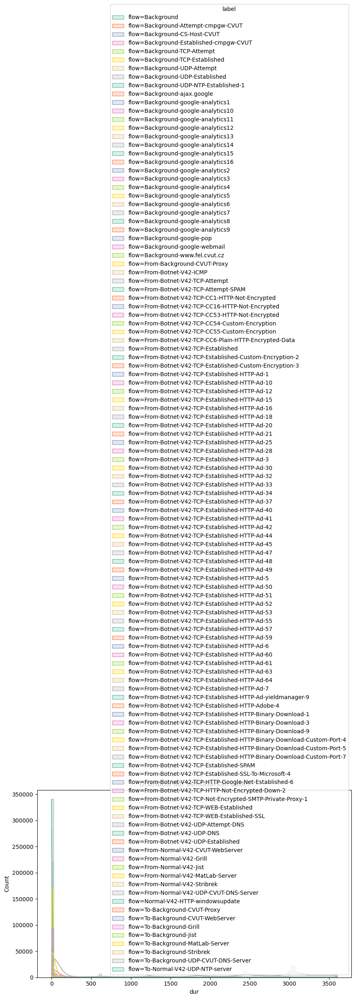


Deskripsi dur:
                                           count         mean          std  \
label                                                                        
flow=Background                          18492.0  1432.287354  1543.329590   
flow=Background-Attempt-cmpgw-CVUT       13074.0   324.517029   844.139526   
flow=Background-CS-Host-CVUT                22.0    17.629698    10.167639   
flow=Background-Established-cmpgw-CVUT  136333.0   233.801407   706.193115   
flow=Background-TCP-Attempt              60097.0    16.497925   170.968994   
...                                          ...          ...          ...   
flow=To-Background-Jist                     60.0  2331.417725  1587.303955   
flow=To-Background-MatLab-Server           383.0    66.974541   460.182037   
flow=To-Background-Stribrek                 33.0  1379.363647  1656.491333   
flow=To-Background-UDP-CVUT-DNS-Server  220506.0     2.736413    87.741150   
flow=To-Normal-V42-UDP-NTP-server          116.0

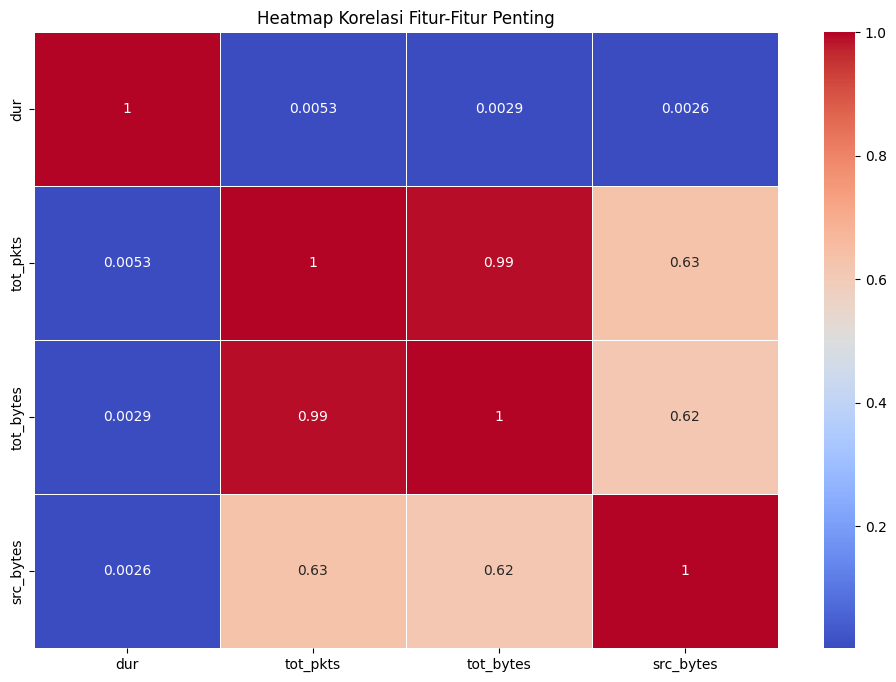


Deskripsi Korelasi Fitur:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.005312   0.002914   0.002562
tot_pkts   0.005312  1.000000   0.990445   0.631175
tot_bytes  0.002914  0.990445   1.000000   0.616593
src_bytes  0.002562  0.631175   0.616593   1.000000


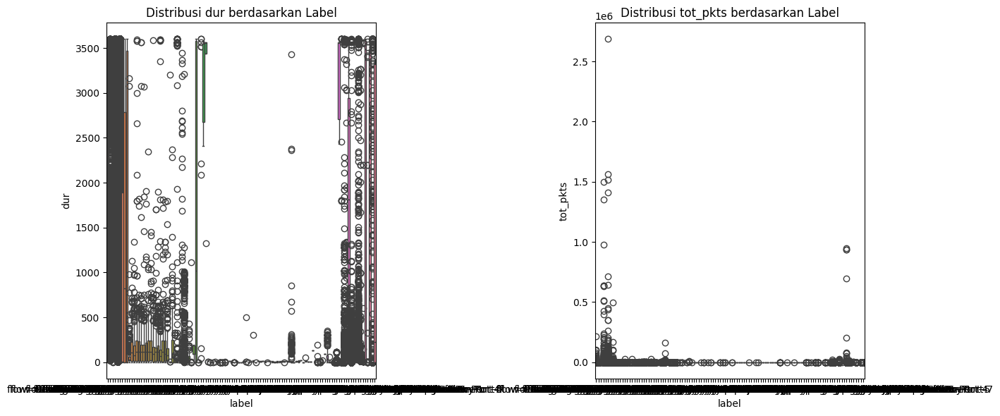


Deskripsi dur dan tot_pkts:
                                             dur                            \
                                           count         mean          std   
label                                                                        
flow=Background                          18492.0  1432.287354  1543.329590   
flow=Background-Attempt-cmpgw-CVUT       13074.0   324.517029   844.139526   
flow=Background-CS-Host-CVUT                22.0    17.629698    10.167639   
flow=Background-Established-cmpgw-CVUT  136333.0   233.801407   706.193115   
flow=Background-TCP-Attempt              60097.0    16.497925   170.968994   
...                                          ...          ...          ...   
flow=To-Background-Jist                     60.0  2331.417725  1587.303955   
flow=To-Background-MatLab-Server           383.0    66.974541   460.182037   
flow=To-Background-Stribrek                 33.0  1379.363647  1656.491333   
flow=To-Background-UDP-CVUT-DNS-Ser

In [6]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Neris_20110810["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label:")
label_counts = df_Neris_20110810["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut
features_of_interest = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Neris_20110810, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur:")
print(df_Neris_20110810.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Neris_20110810[features_of_interest].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur:")
print(df_Neris_20110810[features_of_interest].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Neris_20110810, hue="label")
plt.title("Distribusi dur berdasarkan Label")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Neris_20110810, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts:")
print(df_Neris_20110810.groupby("label")[["dur", "tot_pkts"]].describe())


In [7]:
# Membaca dataset Neris_20110811 dari file parquet
df_Neris_20110811 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\2-Neris-20110811.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Neris_20110811.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1120229 entries, 0 to 1120228
Data columns (total 11 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   dur        1120229 non-null  float32 
 1   proto      1120229 non-null  category
 2   dir        1120229 non-null  category
 3   state      1120229 non-null  category
 4   stos       1117708 non-null  float32 
 5   dtos       907881 non-null   float32 
 6   tot_pkts   1120229 non-null  int32   
 7   tot_bytes  1120229 non-null  int64   
 8   src_bytes  1120229 non-null  int32   
 9   label      1120229 non-null  category
 10  Family     1120229 non-null  category
dtypes: category(5), float32(3), int32(2), int64(1)
memory usage: 37.4 MB


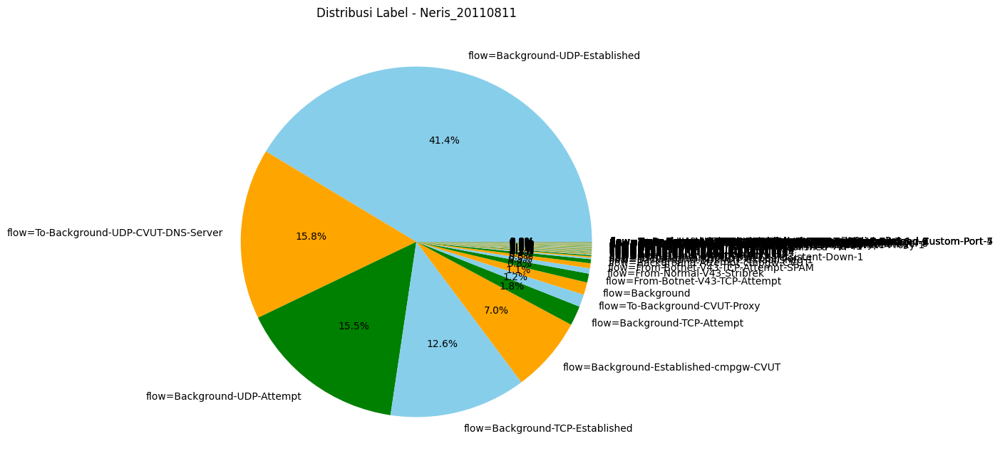

Deskripsi Distribusi Label - Neris_20110811:
flow=Background-UDP-Established                             463455
flow=To-Background-UDP-CVUT-DNS-Server                      176532
flow=Background-UDP-Attempt                                 173836
flow=Background-TCP-Established                             140673
flow=Background-Established-cmpgw-CVUT                       77933
                                                             ...  
flow=From-Botnet-V43-TCP-Established-HTTP-Ad-51                  1
flow=From-Botnet-V43-TCP-Established-HTTP-To-Microsoft-1         1
flow=From-Botnet-V43-TCP-Established-HTTP-Ad-60                  1
flow=From-Botnet-V43-TCP-HTTP-Not-Encrypted-Down-2               1
flow=From-Botnet-V43-TCP-Established-HTTP-Ad-23                  1
Name: label, Length: 132, dtype: int64


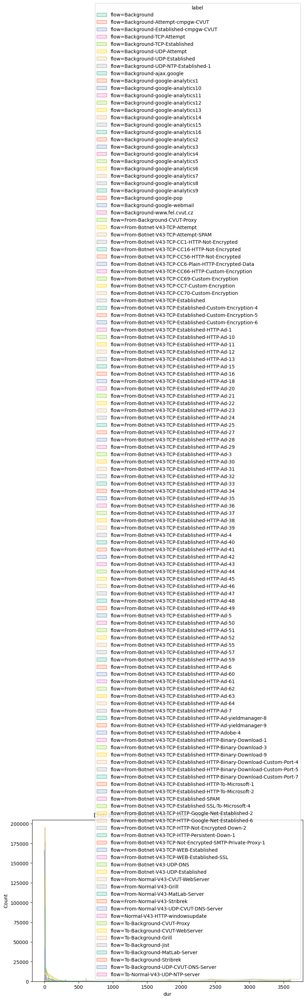


Deskripsi dur - Neris_20110811:
                                           count         mean          std  \
label                                                                        
flow=Background                          12800.0  1357.879395  1478.382568   
flow=Background-Attempt-cmpgw-CVUT        4152.0   498.120850  1049.761353   
flow=Background-Established-cmpgw-CVUT   77933.0   211.304657   651.372131   
flow=Background-TCP-Attempt              20269.0    13.634218    81.997337   
flow=Background-TCP-Established         140673.0    72.348869   316.924835   
...                                          ...          ...          ...   
flow=To-Background-Jist                      2.0     0.000000     0.000000   
flow=To-Background-MatLab-Server            13.0     0.223078     0.803803   
flow=To-Background-Stribrek                 27.0  1554.960449  1725.308350   
flow=To-Background-UDP-CVUT-DNS-Server  176532.0     1.372368    62.008911   
flow=To-Normal-V43-UDP-NTP-serv

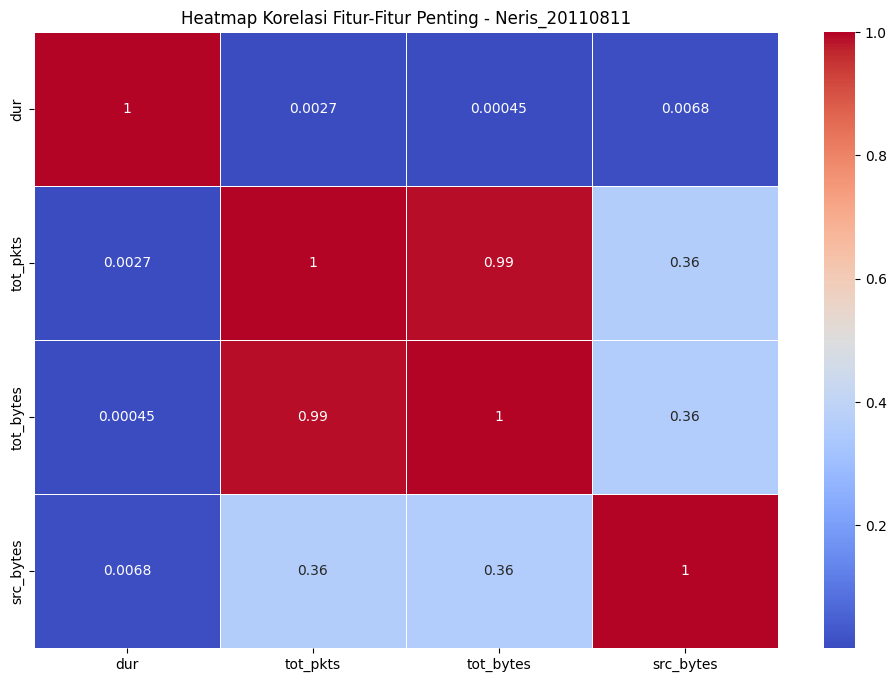


Deskripsi Korelasi Fitur - Neris_20110811:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.002727   0.000448   0.006804
tot_pkts   0.002727  1.000000   0.988526   0.362611
tot_bytes  0.000448  0.988526   1.000000   0.356731
src_bytes  0.006804  0.362611   0.356731   1.000000


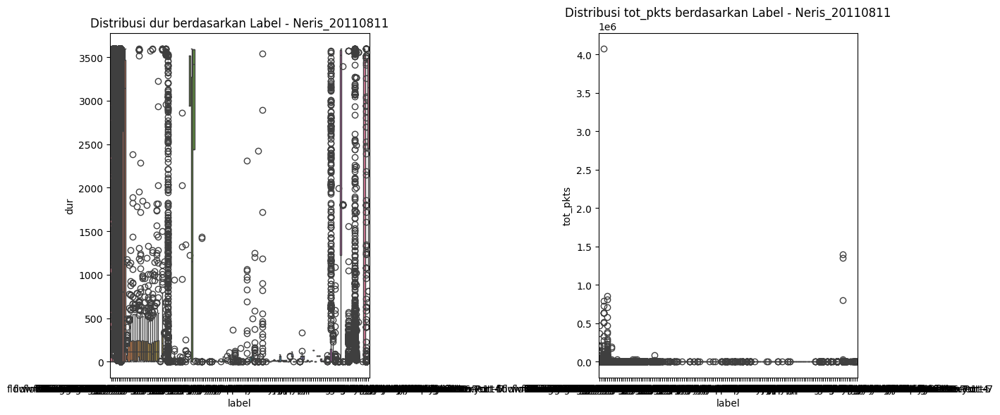


Deskripsi dur dan tot_pkts - Neris_20110811:
                                             dur                            \
                                           count         mean          std   
label                                                                        
flow=Background                          12800.0  1357.879395  1478.382568   
flow=Background-Attempt-cmpgw-CVUT        4152.0   498.120850  1049.761353   
flow=Background-Established-cmpgw-CVUT   77933.0   211.304657   651.372131   
flow=Background-TCP-Attempt              20269.0    13.634218    81.997337   
flow=Background-TCP-Established         140673.0    72.348869   316.924835   
...                                          ...          ...          ...   
flow=To-Background-Jist                      2.0     0.000000     0.000000   
flow=To-Background-MatLab-Server            13.0     0.223078     0.803803   
flow=To-Background-Stribrek                 27.0  1554.960449  1725.308350   
flow=To-Background

In [8]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Neris_20110811["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Neris_20110811")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Neris_20110811:")
label_counts = df_Neris_20110811["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut
features_of_interest = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Neris_20110811, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Neris_20110811")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Neris_20110811:")
print(df_Neris_20110811.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Neris_20110811[features_of_interest].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Neris_20110811")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Neris_20110811:")
print(df_Neris_20110811[features_of_interest].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Neris_20110811, hue="label")
plt.title("Distribusi dur berdasarkan Label - Neris_20110811")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Neris_20110811, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Neris_20110811")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Neris_20110811:")
print(df_Neris_20110811.groupby("label")[["dur", "tot_pkts"]].describe())


In [9]:
# Membaca dataset Rbot-20110812 dari file parquet
df_Rbot_20110812 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\3-Rbot-20110812.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Rbot_20110812.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1853035 entries, 0 to 1853034
Data columns (total 11 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   dur        1853035 non-null  float32 
 1   proto      1853035 non-null  category
 2   dir        1853035 non-null  category
 3   state      1853034 non-null  category
 4   stos       1820829 non-null  float32 
 5   dtos       1684134 non-null  float32 
 6   tot_pkts   1853035 non-null  int32   
 7   tot_bytes  1853035 non-null  int64   
 8   src_bytes  1853035 non-null  int64   
 9   label      1853035 non-null  category
 10  Family     1853035 non-null  category
dtypes: category(5), float32(3), int32(1), int64(2)
memory usage: 67.2 MB


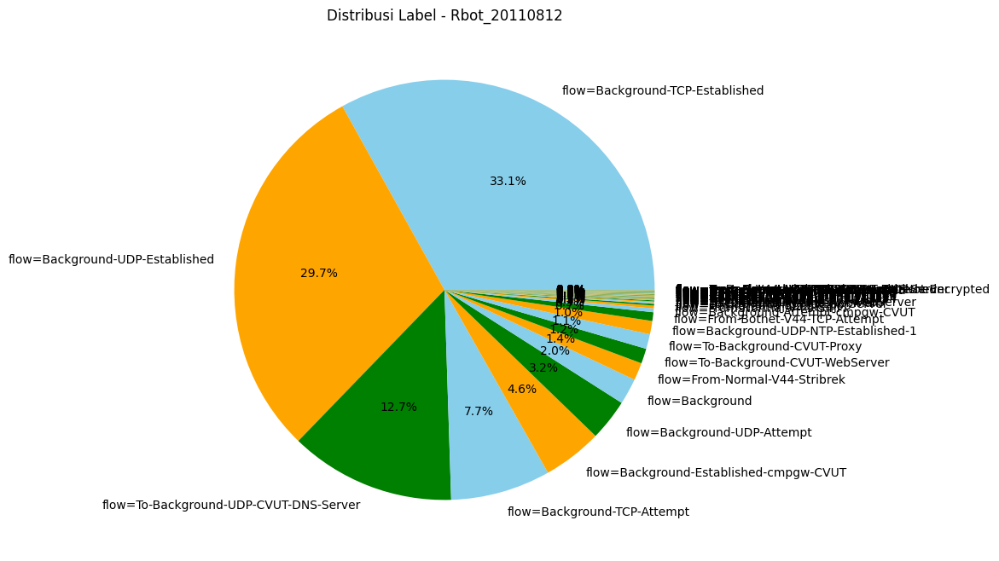

Deskripsi Distribusi Label - Rbot_20110812:
flow=Background-TCP-Established                     612825
flow=Background-UDP-Established                     550308
flow=To-Background-UDP-CVUT-DNS-Server              236075
flow=Background-TCP-Attempt                         142414
flow=Background-Established-cmpgw-CVUT               84682
flow=Background-UDP-Attempt                          59236
flow=Background                                      37126
flow=From-Normal-V44-Stribrek                        25090
flow=To-Background-CVUT-WebServer                    21391
flow=To-Background-CVUT-Proxy                        21109
flow=Background-UDP-NTP-Established-1                18896
flow=From-Botnet-V44-TCP-Attempt                     12377
flow=Background-Attempt-cmpgw-CVUT                    5416
flow=From-Normal-V44-Grill                            4047
flow=Background-google-pop                            2362
flow=To-Background-MatLab-Server                      2012
flow=Backgro

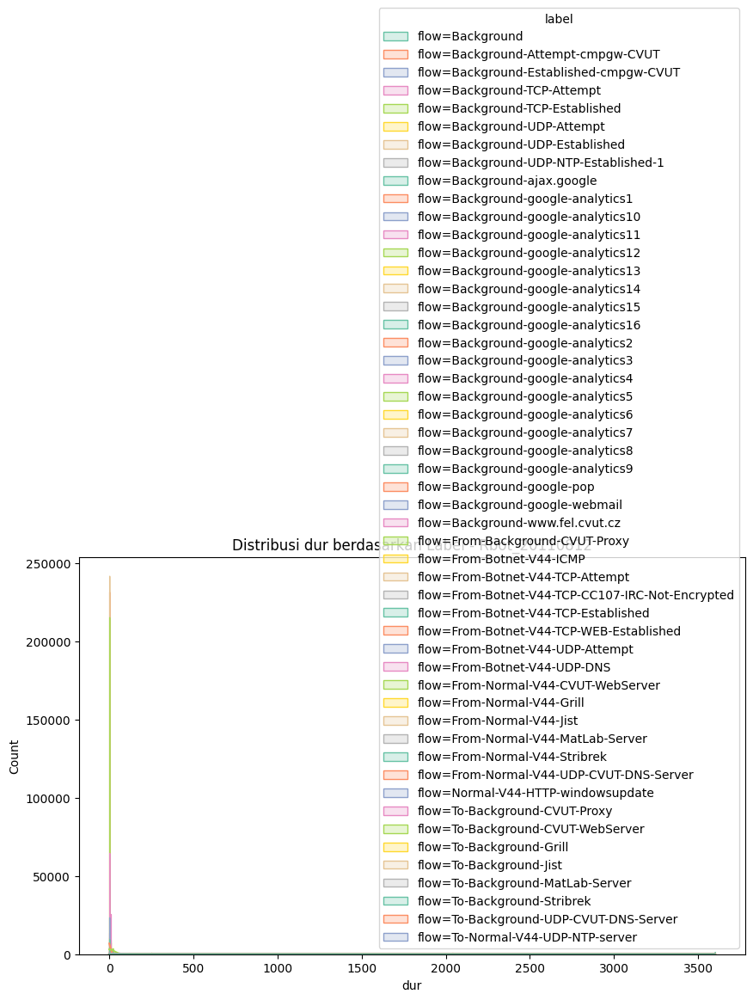


Deskripsi dur - Rbot_20110812:
                                                     count         mean  \
label                                                                     
flow=Background                                    37126.0  1467.465332   
flow=Background-Attempt-cmpgw-CVUT                  5416.0   528.257019   
flow=Background-Established-cmpgw-CVUT             84682.0   192.027863   
flow=Background-TCP-Attempt                       142414.0    82.609863   
flow=Background-TCP-Established                   612825.0    70.321274   
flow=Background-UDP-Attempt                        59236.0   670.494385   
flow=Background-UDP-Established                   550308.0  1080.807495   
flow=Background-UDP-NTP-Established-1              18896.0  2640.353027   
flow=Background-ajax.google                          101.0    98.160637   
flow=Background-google-analytics1                    574.0   133.399521   
flow=Background-google-analytics10                   665.0   132.887

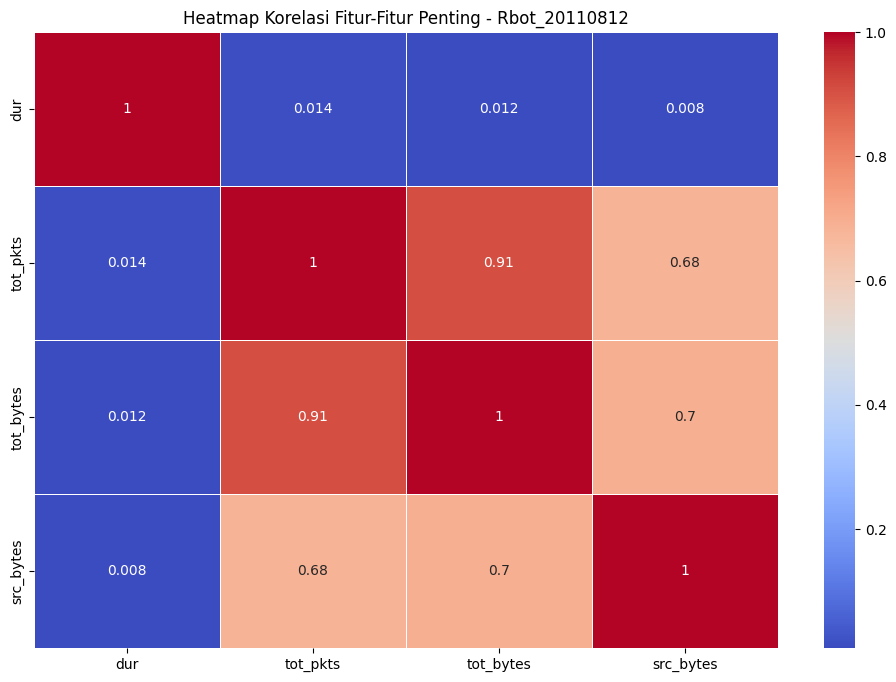


Deskripsi Korelasi Fitur - Rbot_20110812:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.013896   0.011754   0.008020
tot_pkts   0.013896  1.000000   0.910128   0.683685
tot_bytes  0.011754  0.910128   1.000000   0.696006
src_bytes  0.008020  0.683685   0.696006   1.000000


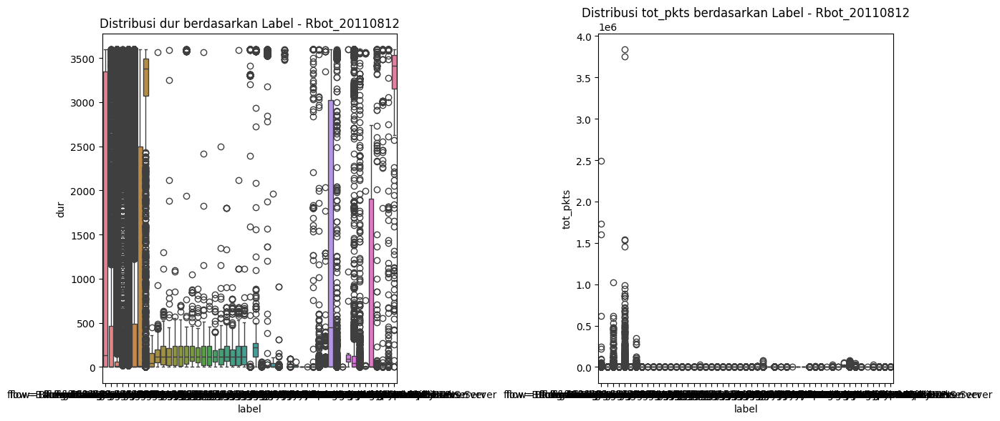


Deskripsi dur dan tot_pkts - Rbot_20110812:
                                                       dur               \
                                                     count         mean   
label                                                                     
flow=Background                                    37126.0  1467.465332   
flow=Background-Attempt-cmpgw-CVUT                  5416.0   528.257019   
flow=Background-Established-cmpgw-CVUT             84682.0   192.027863   
flow=Background-TCP-Attempt                       142414.0    82.609863   
flow=Background-TCP-Established                   612825.0    70.321274   
flow=Background-UDP-Attempt                        59236.0   670.494385   
flow=Background-UDP-Established                   550308.0  1080.807495   
flow=Background-UDP-NTP-Established-1              18896.0  2640.353027   
flow=Background-ajax.google                          101.0    98.160637   
flow=Background-google-analytics1                    57

In [10]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Rbot_20110812["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Rbot_20110812")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Rbot_20110812:")
label_counts = df_Rbot_20110812["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_rbot = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Rbot_20110812, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Rbot_20110812")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Rbot_20110812:")
print(df_Rbot_20110812.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Rbot_20110812[features_of_interest_rbot].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Rbot_20110812")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Rbot_20110812:")
print(df_Rbot_20110812[features_of_interest_rbot].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Rbot_20110812, hue="label")
plt.title("Distribusi dur berdasarkan Label - Rbot_20110812")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Rbot_20110812, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Rbot_20110812")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Rbot_20110812:")
print(df_Rbot_20110812.groupby("label")[["dur", "tot_pkts"]].describe())


In [11]:
# Membaca dataset Rbot-20110815 dari file parquet
df_Rbot_20110815 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\4-Rbot-20110815.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Rbot_20110815.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 702322 entries, 0 to 702321
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   dur        702322 non-null  float32 
 1   proto      702322 non-null  category
 2   dir        702322 non-null  category
 3   state      702320 non-null  category
 4   stos       697911 non-null  float32 
 5   dtos       662830 non-null  float32 
 6   tot_pkts   702322 non-null  int32   
 7   tot_bytes  702322 non-null  int64   
 8   src_bytes  702322 non-null  int32   
 9   label      702322 non-null  category
 10  Family     702322 non-null  category
dtypes: category(5), float32(3), int32(2), int64(1)
memory usage: 22.8 MB


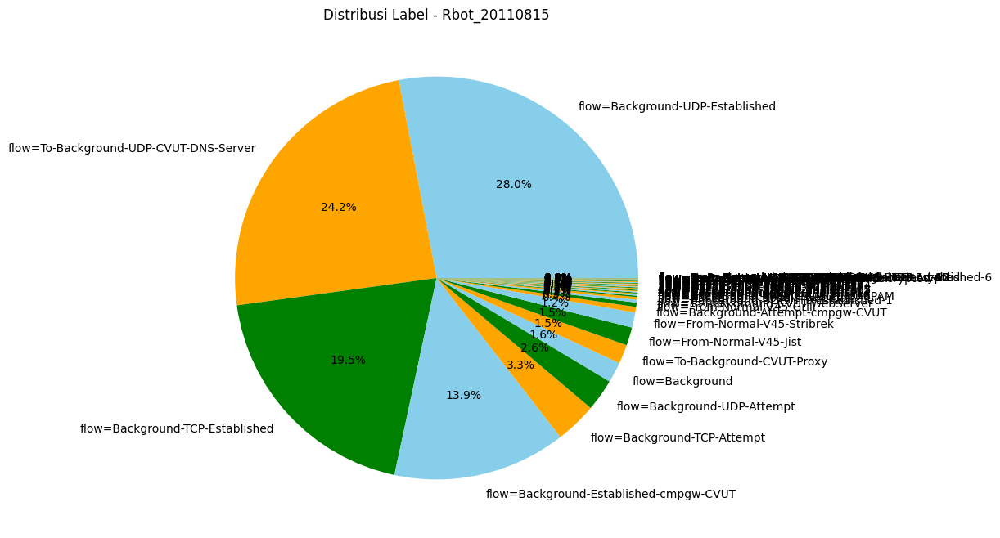

Deskripsi Distribusi Label - Rbot_20110815:
flow=Background-UDP-Established                           196717
flow=To-Background-UDP-CVUT-DNS-Server                    169685
flow=Background-TCP-Established                           136746
flow=Background-Established-cmpgw-CVUT                     97458
flow=Background-TCP-Attempt                                23324
flow=Background-UDP-Attempt                                18078
flow=Background                                            11524
flow=To-Background-CVUT-Proxy                              10761
flow=From-Normal-V45-Jist                                  10217
flow=From-Normal-V45-Stribrek                               8538
flow=Background-Attempt-cmpgw-CVUT                          3146
flow=From-Normal-V45-Grill                                  2403
flow=To-Background-CVUT-WebServer                           1617
flow=Background-UDP-NTP-Established-1                       1491
flow=Background-google-webmail                

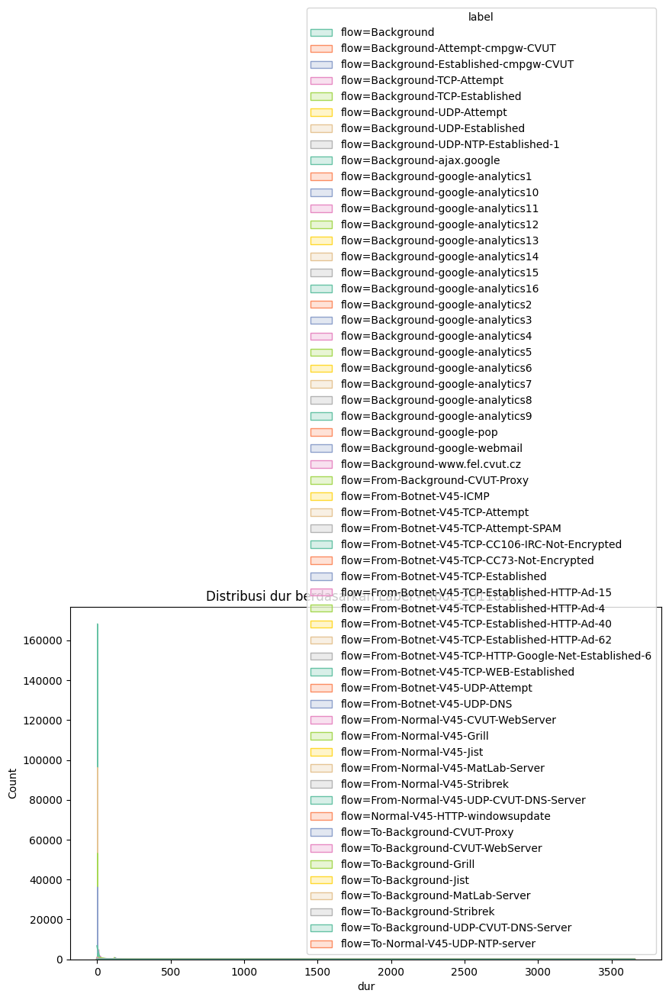


Deskripsi dur - Rbot_20110815:
                                                       count         mean  \
label                                                                       
flow=Background                                      11524.0  1100.238281   
flow=Background-Attempt-cmpgw-CVUT                    3146.0   547.904541   
flow=Background-Established-cmpgw-CVUT               97458.0   206.517838   
flow=Background-TCP-Attempt                          23324.0     7.171358   
flow=Background-TCP-Established                     136746.0    76.114693   
flow=Background-UDP-Attempt                          18078.0   587.942017   
flow=Background-UDP-Established                     196717.0   996.405334   
flow=Background-UDP-NTP-Established-1                 1491.0  2219.587646   
flow=Background-ajax.google                            175.0   109.457031   
flow=Background-google-analytics1                      515.0   146.459778   
flow=Background-google-analytics10          

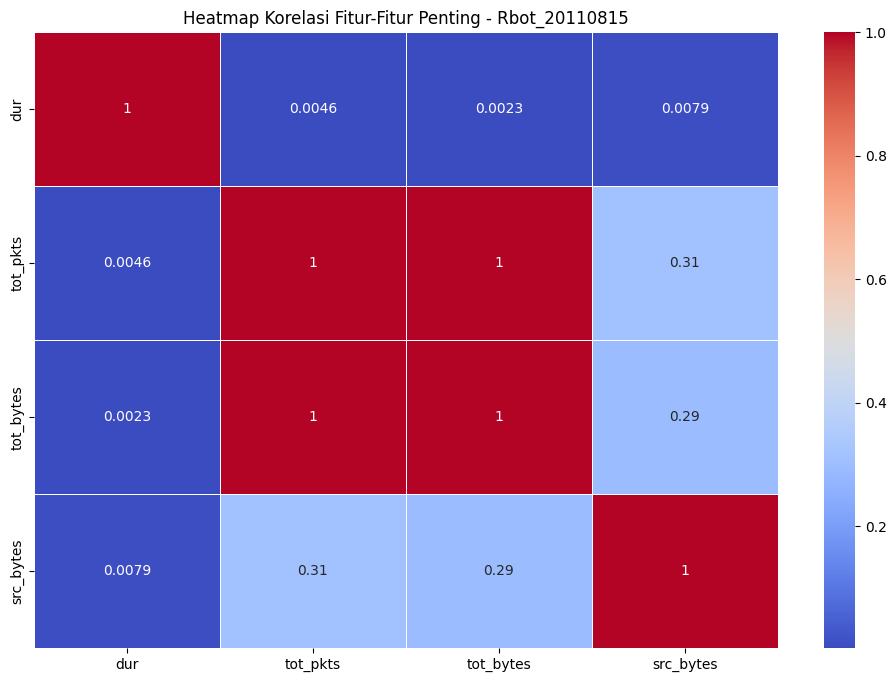


Deskripsi Korelasi Fitur - Rbot_20110815:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.004578   0.002265   0.007907
tot_pkts   0.004578  1.000000   0.996624   0.313794
tot_bytes  0.002265  0.996624   1.000000   0.290871
src_bytes  0.007907  0.313794   0.290871   1.000000


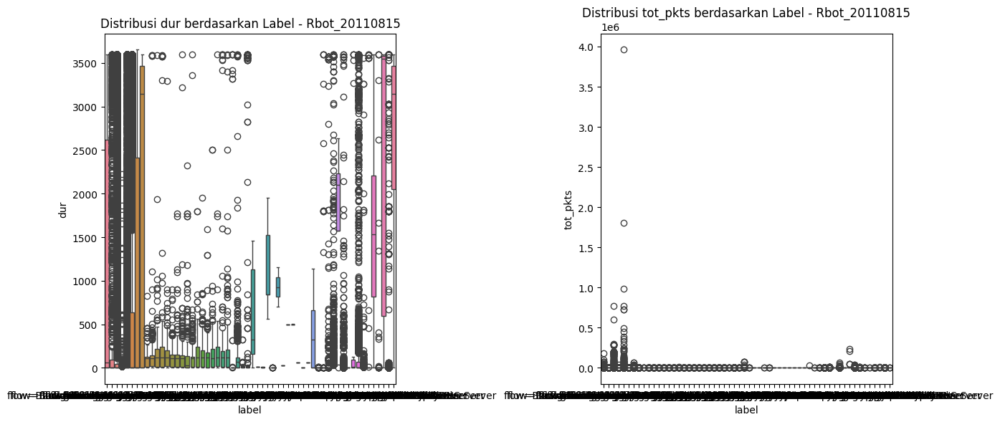


Deskripsi dur dan tot_pkts - Rbot_20110815:
                                                         dur               \
                                                       count         mean   
label                                                                       
flow=Background                                      11524.0  1100.238281   
flow=Background-Attempt-cmpgw-CVUT                    3146.0   547.904541   
flow=Background-Established-cmpgw-CVUT               97458.0   206.517838   
flow=Background-TCP-Attempt                          23324.0     7.171358   
flow=Background-TCP-Established                     136746.0    76.114693   
flow=Background-UDP-Attempt                          18078.0   587.942017   
flow=Background-UDP-Established                     196717.0   996.405334   
flow=Background-UDP-NTP-Established-1                 1491.0  2219.587646   
flow=Background-ajax.google                            175.0   109.457031   
flow=Background-google-analytic

In [12]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Rbot_20110815["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Rbot_20110815")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Rbot_20110815:")
label_counts = df_Rbot_20110815["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_rbot = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Rbot_20110815, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Rbot_20110815")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Rbot_20110815:")
print(df_Rbot_20110815.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Rbot_20110815[features_of_interest_rbot].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Rbot_20110815")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Rbot_20110815:")
print(df_Rbot_20110815[features_of_interest_rbot].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Rbot_20110815, hue="label")
plt.title("Distribusi dur berdasarkan Label - Rbot_20110815")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Rbot_20110815, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Rbot_20110815")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Rbot_20110815:")
print(df_Rbot_20110815.groupby("label")[["dur", "tot_pkts"]].describe())


In [14]:
# Membaca dataset Virut-20110815 dari file parquet
df_Virut_20110815 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\5-Virut-20110815-2.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Virut_20110815.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92900 entries, 0 to 92899
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   dur        92900 non-null  float32 
 1   proto      92900 non-null  category
 2   dir        92900 non-null  category
 3   state      92900 non-null  category
 4   stos       92332 non-null  float32 
 5   dtos       88109 non-null  float32 
 6   tot_pkts   92900 non-null  int32   
 7   tot_bytes  92900 non-null  int32   
 8   src_bytes  92900 non-null  int32   
 9   label      92900 non-null  category
 10  Family     92900 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 2.7 MB


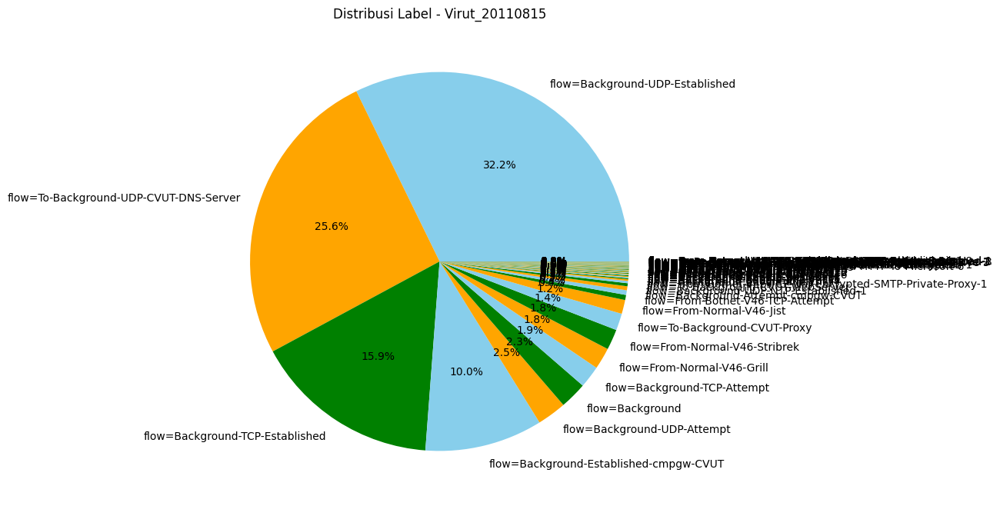

Deskripsi Distribusi Label - Virut_20110815:
flow=Background-UDP-Established                           29950
flow=To-Background-UDP-CVUT-DNS-Server                    23817
flow=Background-TCP-Established                           14797
flow=Background-Established-cmpgw-CVUT                     9324
flow=Background-UDP-Attempt                                2310
                                                          ...  
flow=From-Botnet-V46-TCP-Established                          1
flow=From-Botnet-V46-TCP-CC7-Custom-Encryption                1
flow=From-Botnet-V46-UDP-Attempt-DNS                          1
flow=From-Botnet-V46-TCP-HTTP-Google-Net-Established-6        1
flow=From-Botnet-V46-TCP-Established-HTTP-Ad-4                1
Name: label, Length: 77, dtype: int64


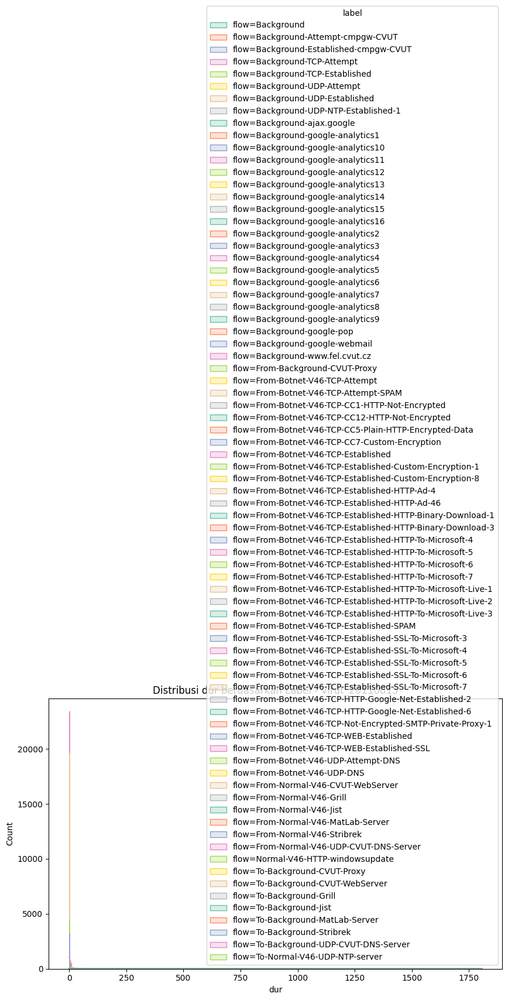


Deskripsi dur - Virut_20110815:
                                          count         mean         std  \
label                                                                      
flow=Background                          2139.0   678.513000  749.372253   
flow=Background-Attempt-cmpgw-CVUT        368.0   193.353561  438.025970   
flow=Background-Established-cmpgw-CVUT   9324.0    81.869240  260.142761   
flow=Background-TCP-Attempt              1756.0     7.357270   41.579388   
flow=Background-TCP-Established         14797.0    34.680222  120.468781   
...                                         ...          ...         ...   
flow=To-Background-Jist                    11.0   953.468506  320.553558   
flow=To-Background-MatLab-Server           67.0    30.646221  202.037689   
flow=To-Background-Stribrek                 3.0  1587.618774  334.274200   
flow=To-Background-UDP-CVUT-DNS-Server  23817.0     0.653120   22.861893   
flow=To-Normal-V46-UDP-NTP-server          11.0  1275.3

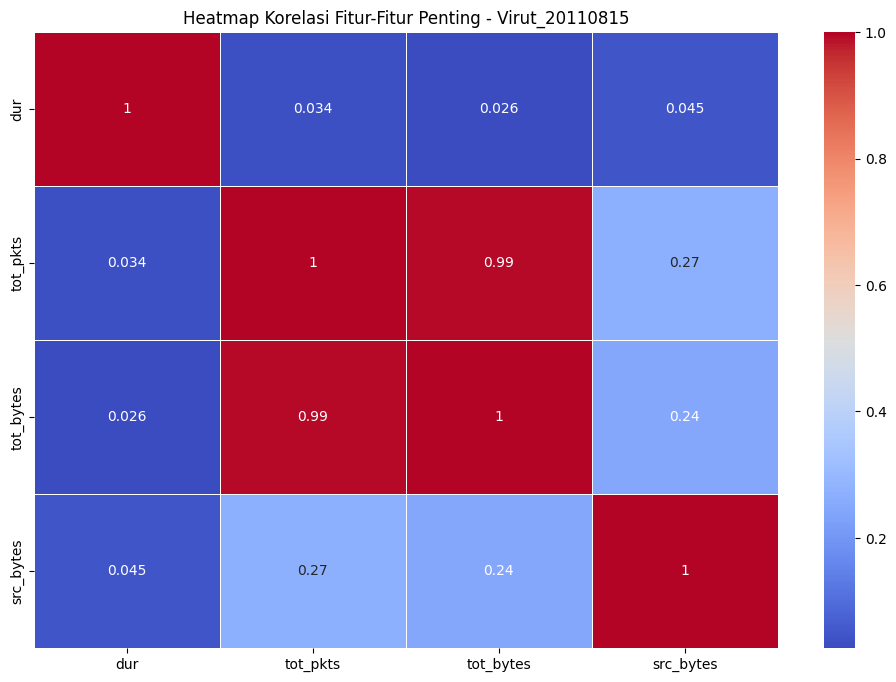


Deskripsi Korelasi Fitur - Virut_20110815:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.033808   0.025543   0.045390
tot_pkts   0.033808  1.000000   0.993626   0.271890
tot_bytes  0.025543  0.993626   1.000000   0.242735
src_bytes  0.045390  0.271890   0.242735   1.000000


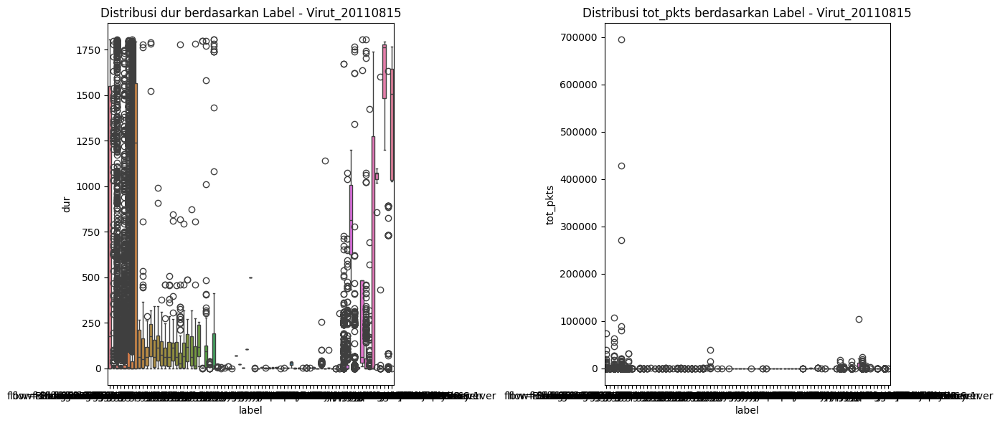


Deskripsi dur dan tot_pkts - Virut_20110815:
                                            dur                           \
                                          count         mean         std   
label                                                                      
flow=Background                          2139.0   678.513000  749.372253   
flow=Background-Attempt-cmpgw-CVUT        368.0   193.353561  438.025970   
flow=Background-Established-cmpgw-CVUT   9324.0    81.869240  260.142761   
flow=Background-TCP-Attempt              1756.0     7.357270   41.579388   
flow=Background-TCP-Established         14797.0    34.680222  120.468781   
...                                         ...          ...         ...   
flow=To-Background-Jist                    11.0   953.468506  320.553558   
flow=To-Background-MatLab-Server           67.0    30.646221  202.037689   
flow=To-Background-Stribrek                 3.0  1587.618774  334.274200   
flow=To-Background-UDP-CVUT-DNS-Server  23

In [15]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Virut_20110815["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Virut_20110815")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Virut_20110815:")
label_counts = df_Virut_20110815["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_virut = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Virut_20110815, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Virut_20110815")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Virut_20110815:")
print(df_Virut_20110815.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Virut_20110815[features_of_interest_virut].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Virut_20110815")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Virut_20110815:")
print(df_Virut_20110815[features_of_interest_virut].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Virut_20110815, hue="label")
plt.title("Distribusi dur berdasarkan Label - Virut_20110815")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Virut_20110815, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Virut_20110815")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Virut_20110815:")
print(df_Virut_20110815.groupby("label")[["dur", "tot_pkts"]].describe())


In [16]:
# Membaca dataset Menti-20110816 dari file parquet
df_Menti_20110816 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\6-Menti-20110816.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Menti_20110816.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353386 entries, 0 to 353385
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   dur        353386 non-null  float32 
 1   proto      353386 non-null  category
 2   dir        353386 non-null  category
 3   state      353386 non-null  category
 4   stos       351028 non-null  float32 
 5   dtos       329194 non-null  float32 
 6   tot_pkts   353386 non-null  int32   
 7   tot_bytes  353386 non-null  int32   
 8   src_bytes  353386 non-null  int32   
 9   label      353386 non-null  category
 10  Family     353386 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 10.1 MB


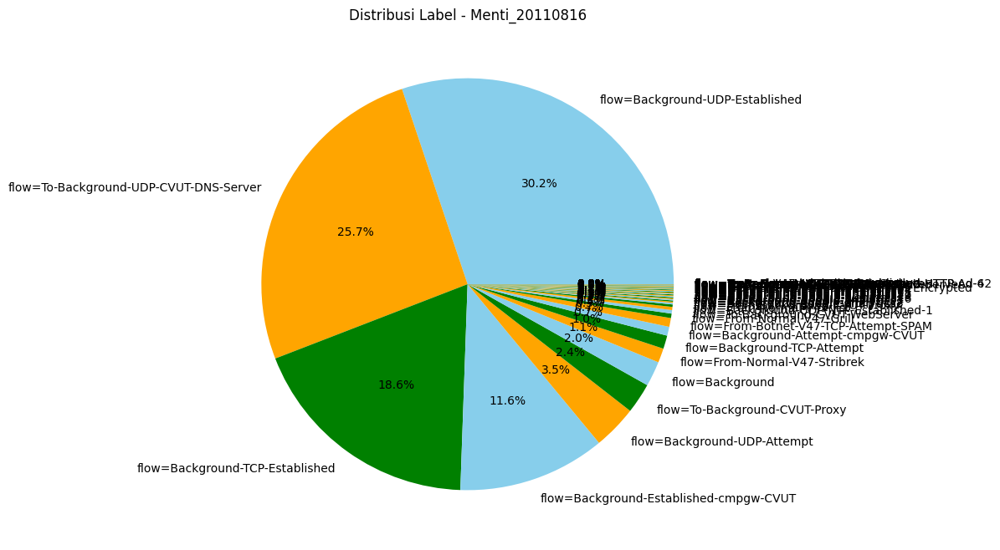

Deskripsi Distribusi Label - Menti_20110816:
flow=Background-UDP-Established                    106566
flow=To-Background-UDP-CVUT-DNS-Server              90900
flow=Background-TCP-Established                     65600
flow=Background-Established-cmpgw-CVUT              40861
flow=Background-UDP-Attempt                         12203
flow=To-Background-CVUT-Proxy                        8434
flow=Background                                      6962
flow=From-Normal-V47-Stribrek                        3953
flow=Background-TCP-Attempt                          3691
flow=Background-Attempt-cmpgw-CVUT                   2478
flow=From-Botnet-V47-TCP-Attempt-SPAM                2435
flow=From-Normal-V47-Grill                           1232
flow=To-Background-CVUT-WebServer                     969
flow=Background-UDP-NTP-Established-1                 880
flow=From-Normal-V47-Jist                             669
flow=From-Background-CVUT-Proxy                       451
flow=Background-google-anal

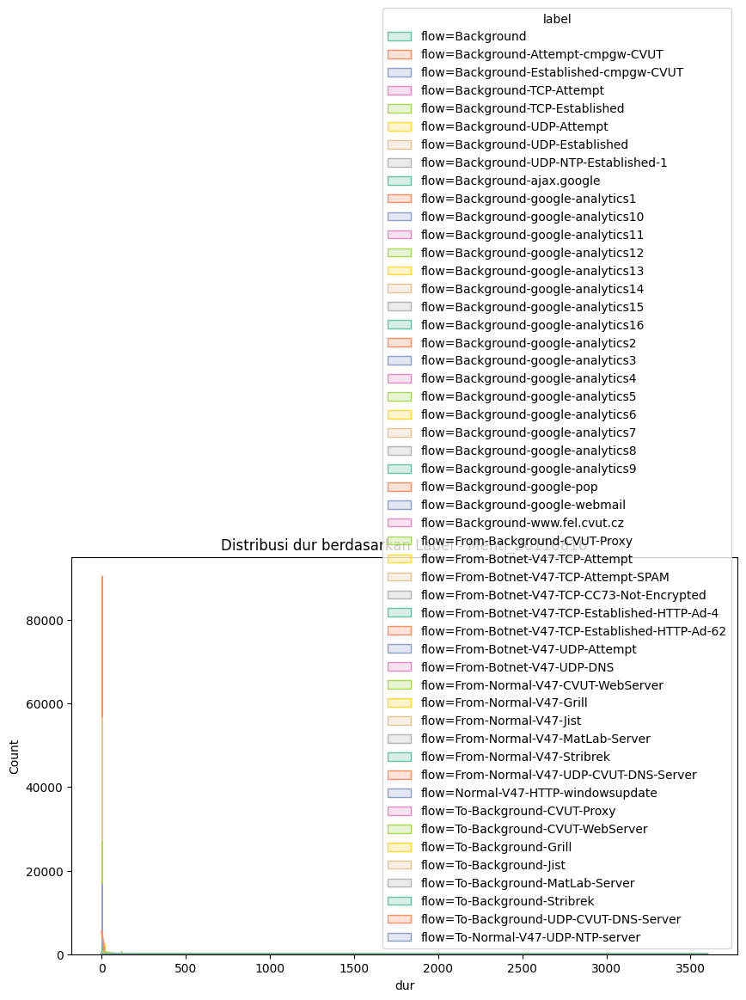


Deskripsi dur - Menti_20110816:
                                                    count         mean  \
label                                                                    
flow=Background                                    6962.0  1036.345459   
flow=Background-Attempt-cmpgw-CVUT                 2478.0   286.822144   
flow=Background-Established-cmpgw-CVUT            40861.0   347.271271   
flow=Background-TCP-Attempt                        3691.0    15.342669   
flow=Background-TCP-Established                   65600.0    82.272507   
flow=Background-UDP-Attempt                       12203.0   702.969116   
flow=Background-UDP-Established                  106566.0   902.939331   
flow=Background-UDP-NTP-Established-1               880.0  1948.429810   
flow=Background-ajax.google                         145.0   108.428841   
flow=Background-google-analytics1                   222.0   130.385422   
flow=Background-google-analytics10                  242.0   137.836578   
flow=

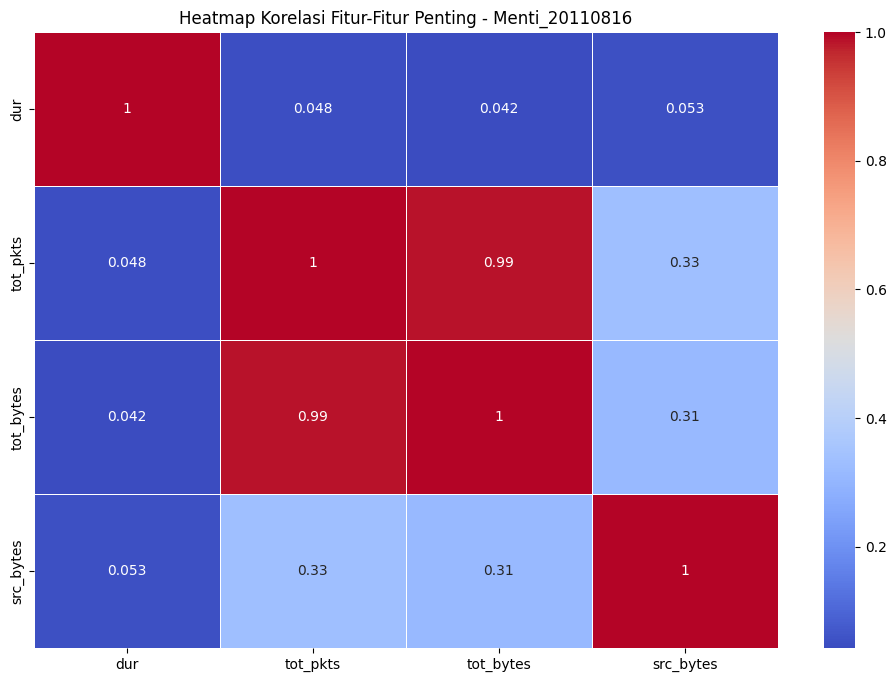


Deskripsi Korelasi Fitur - Menti_20110816:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.047968   0.041937   0.052824
tot_pkts   0.047968  1.000000   0.988627   0.330496
tot_bytes  0.041937  0.988627   1.000000   0.311611
src_bytes  0.052824  0.330496   0.311611   1.000000


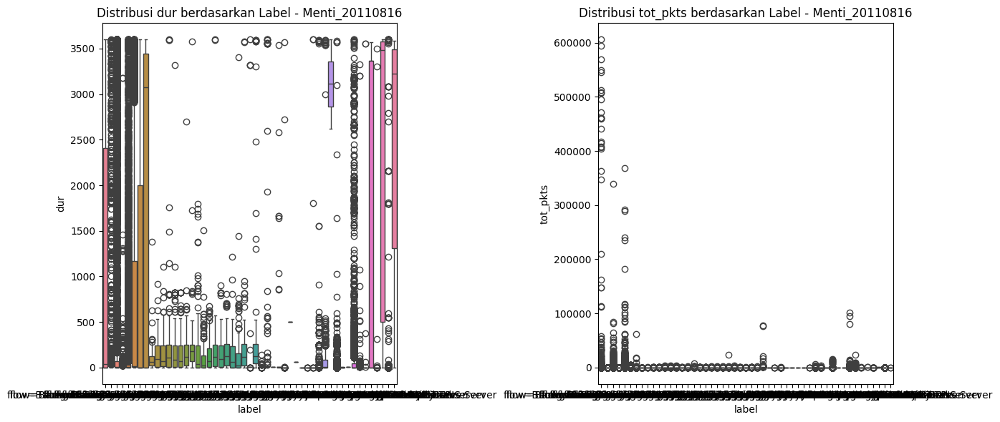


Deskripsi dur dan tot_pkts - Menti_20110816:
                                                      dur               \
                                                    count         mean   
label                                                                    
flow=Background                                    6962.0  1036.345459   
flow=Background-Attempt-cmpgw-CVUT                 2478.0   286.822144   
flow=Background-Established-cmpgw-CVUT            40861.0   347.271271   
flow=Background-TCP-Attempt                        3691.0    15.342669   
flow=Background-TCP-Established                   65600.0    82.272507   
flow=Background-UDP-Attempt                       12203.0   702.969116   
flow=Background-UDP-Established                  106566.0   902.939331   
flow=Background-UDP-NTP-Established-1               880.0  1948.429810   
flow=Background-ajax.google                         145.0   108.428841   
flow=Background-google-analytics1                   222.0   130.38

In [17]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Menti_20110816["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Menti_20110816")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Menti_20110816:")
label_counts = df_Menti_20110816["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_menti = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Menti_20110816, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Menti_20110816")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Menti_20110816:")
print(df_Menti_20110816.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Menti_20110816[features_of_interest_menti].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Menti_20110816")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Menti_20110816:")
print(df_Menti_20110816[features_of_interest_menti].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Menti_20110816, hue="label")
plt.title("Distribusi dur berdasarkan Label - Menti_20110816")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Menti_20110816, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Menti_20110816")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Menti_20110816:")
print(df_Menti_20110816.groupby("label")[["dur", "tot_pkts"]].describe())


In [18]:
# Membaca dataset Sogou-20110816 dari file parquet
df_Sogou_20110816 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\7-Sogou-20110816-2.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Sogou_20110816.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84273 entries, 0 to 84272
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   dur        84273 non-null  float32 
 1   proto      84273 non-null  category
 2   dir        84273 non-null  category
 3   state      84273 non-null  category
 4   stos       83748 non-null  float32 
 5   dtos       78569 non-null  float32 
 6   tot_pkts   84273 non-null  int32   
 7   tot_bytes  84273 non-null  int32   
 8   src_bytes  84273 non-null  int32   
 9   label      84273 non-null  category
 10  Family     84273 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 2.4 MB


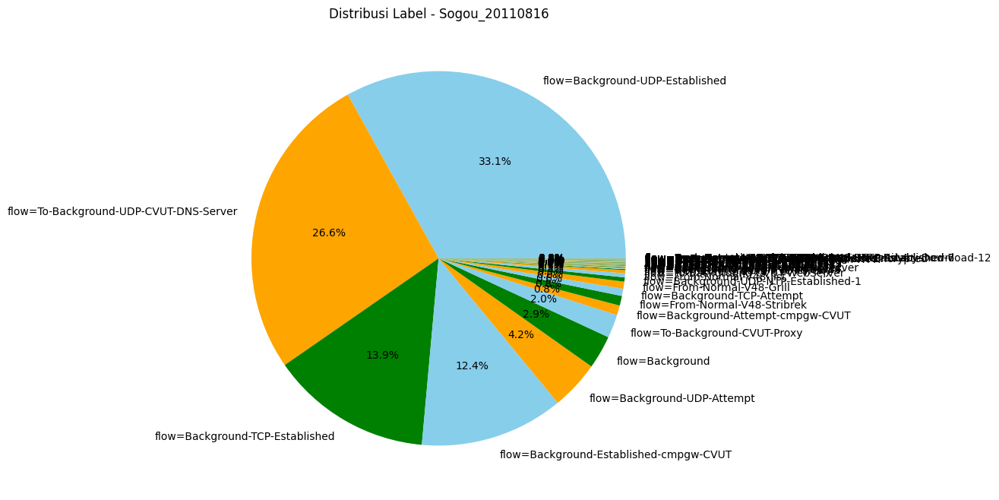

Deskripsi Distribusi Label - Sogou_20110816:
flow=Background-UDP-Established                                 27866
flow=To-Background-UDP-CVUT-DNS-Server                          22400
flow=Background-TCP-Established                                 11733
flow=Background-Established-cmpgw-CVUT                          10456
flow=Background-UDP-Attempt                                      3561
flow=Background                                                  2428
flow=To-Background-CVUT-Proxy                                    1704
flow=Background-Attempt-cmpgw-CVUT                                705
flow=From-Normal-V48-Stribrek                                     705
flow=Background-TCP-Attempt                                       522
flow=From-Normal-V48-Grill                                        518
flow=Background-UDP-NTP-Established-1                             307
flow=From-Normal-V48-Jist                                         292
flow=To-Background-CVUT-WebServer            

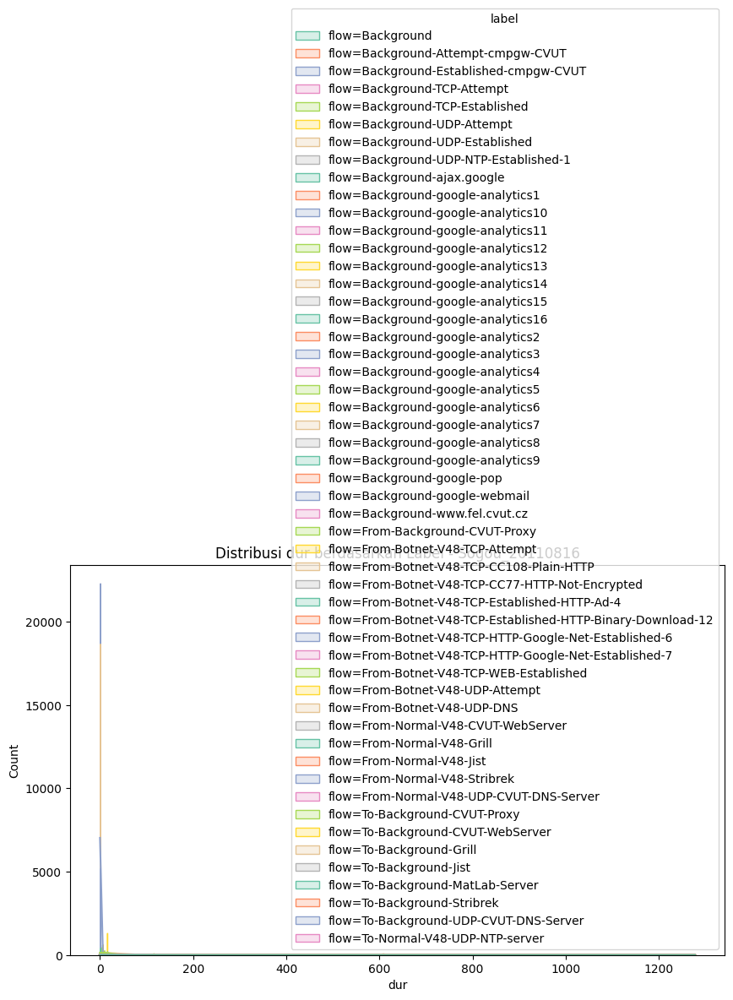


Deskripsi dur - Sogou_20110816:
                                                      count         mean  \
label                                                                      
flow=Background                                      2428.0   542.163208   
flow=Background-Attempt-cmpgw-CVUT                    705.0   131.590836   
flow=Background-Established-cmpgw-CVUT              10456.0   184.150375   
flow=Background-TCP-Attempt                           522.0     8.030511   
flow=Background-TCP-Established                     11733.0    36.625458   
flow=Background-UDP-Attempt                          3561.0   145.199341   
flow=Background-UDP-Established                     27866.0   175.627151   
flow=Background-UDP-NTP-Established-1                 307.0   636.920349   
flow=Background-ajax.google                             9.0   207.766190   
flow=Background-google-analytics1                      33.0   172.799057   
flow=Background-google-analytics10                     

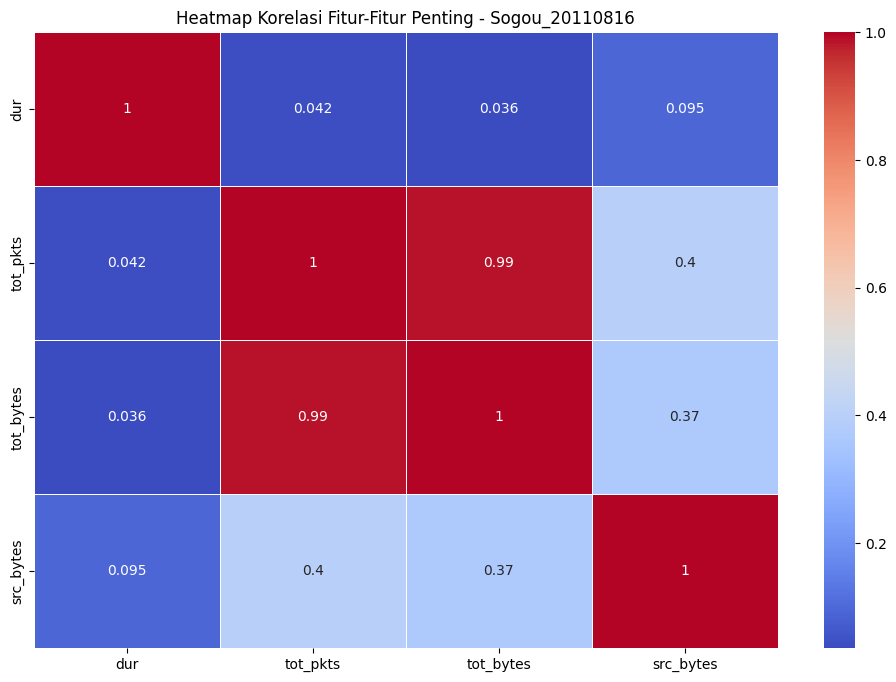


Deskripsi Korelasi Fitur - Sogou_20110816:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.042464   0.035575   0.095480
tot_pkts   0.042464  1.000000   0.988485   0.396857
tot_bytes  0.035575  0.988485   1.000000   0.370493
src_bytes  0.095480  0.396857   0.370493   1.000000


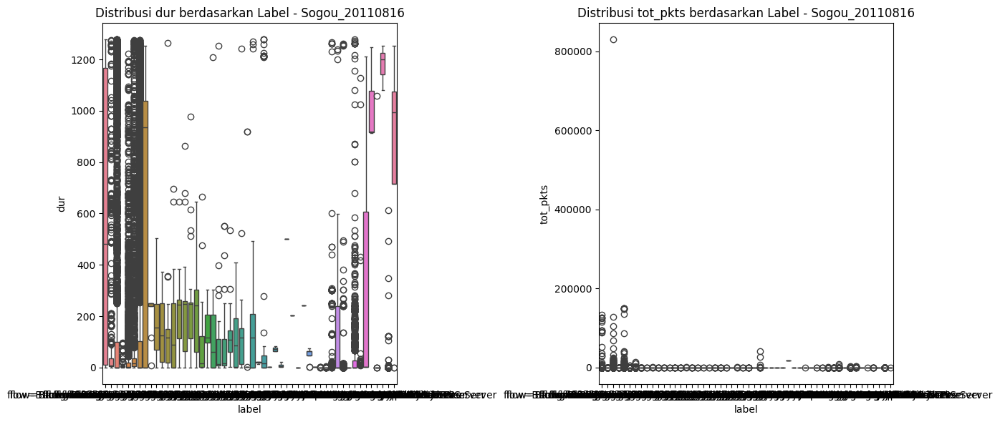


Deskripsi dur dan tot_pkts - Sogou_20110816:
                                                        dur               \
                                                      count         mean   
label                                                                      
flow=Background                                      2428.0   542.163208   
flow=Background-Attempt-cmpgw-CVUT                    705.0   131.590836   
flow=Background-Established-cmpgw-CVUT              10456.0   184.150375   
flow=Background-TCP-Attempt                           522.0     8.030511   
flow=Background-TCP-Established                     11733.0    36.625458   
flow=Background-UDP-Attempt                          3561.0   145.199341   
flow=Background-UDP-Established                     27866.0   175.627151   
flow=Background-UDP-NTP-Established-1                 307.0   636.920349   
flow=Background-ajax.google                             9.0   207.766190   
flow=Background-google-analytics1         

In [19]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Sogou_20110816["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Sogou_20110816")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Sogou_20110816:")
label_counts = df_Sogou_20110816["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_sogou = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Sogou_20110816, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Sogou_20110816")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Sogou_20110816:")
print(df_Sogou_20110816.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Sogou_20110816[features_of_interest_sogou].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Sogou_20110816")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Sogou_20110816:")
print(df_Sogou_20110816[features_of_interest_sogou].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Sogou_20110816, hue="label")
plt.title("Distribusi dur berdasarkan Label - Sogou_20110816")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Sogou_20110816, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Sogou_20110816")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Sogou_20110816:")
print(df_Sogou_20110816.groupby("label")[["dur", "tot_pkts"]].describe())


In [20]:
# Membaca dataset Murlo-20110816 dari file parquet
df_Murlo_20110816 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\8-Murlo-20110816-3.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Murlo_20110816.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1453832 entries, 0 to 1453831
Data columns (total 11 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   dur        1453832 non-null  float32 
 1   proto      1453832 non-null  category
 2   dir        1453832 non-null  category
 3   state      1453831 non-null  category
 4   stos       1441263 non-null  float32 
 5   dtos       1356127 non-null  float32 
 6   tot_pkts   1453832 non-null  int32   
 7   tot_bytes  1453832 non-null  int64   
 8   src_bytes  1453832 non-null  int64   
 9   label      1453832 non-null  category
 10  Family     1453832 non-null  category
dtypes: category(5), float32(3), int32(1), int64(2)
memory usage: 52.7 MB


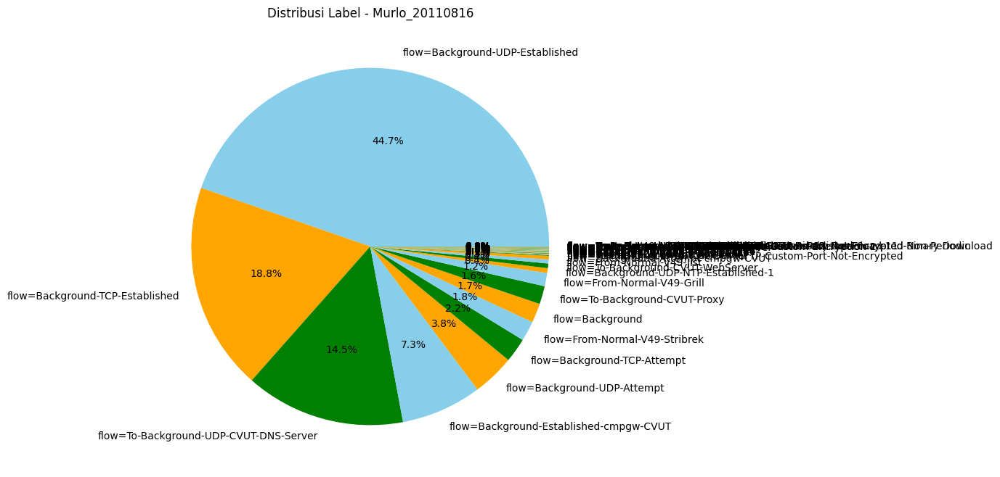

Deskripsi Distribusi Label - Murlo_20110816:
flow=Background-UDP-Established                                                 649522
flow=Background-TCP-Established                                                 273438
flow=To-Background-UDP-CVUT-DNS-Server                                          210135
flow=Background-Established-cmpgw-CVUT                                          105972
flow=Background-UDP-Attempt                                                      55394
flow=Background-TCP-Attempt                                                      31942
flow=From-Normal-V49-Stribrek                                                    26289
flow=Background                                                                  25387
flow=To-Background-CVUT-Proxy                                                    23759
flow=From-Normal-V49-Grill                                                       17430
flow=Background-UDP-NTP-Established-1                                             631

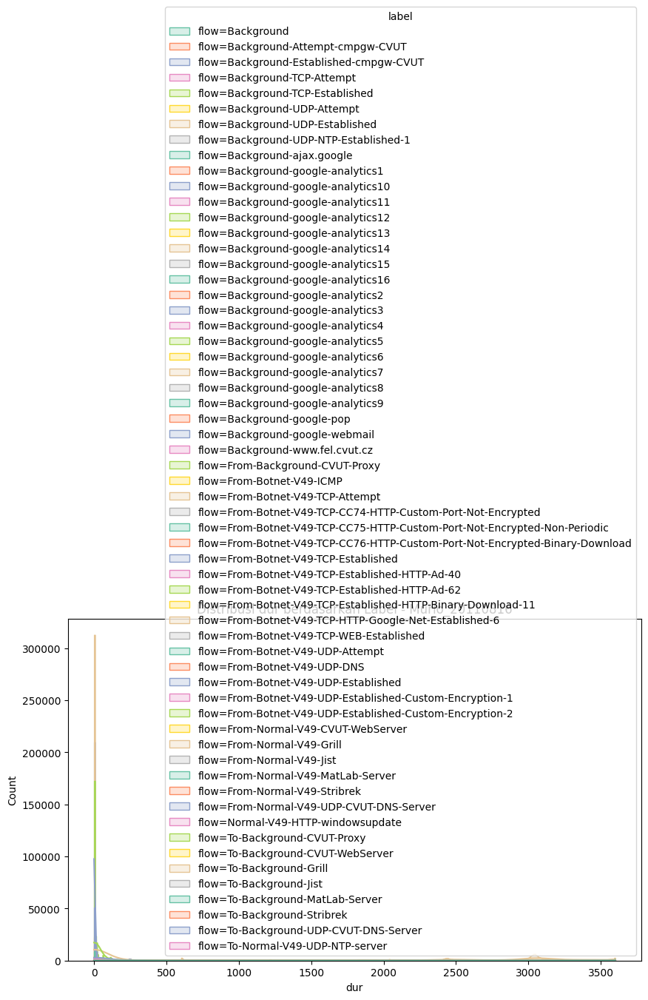


Deskripsi dur - Murlo_20110816:
                                                       count         mean  \
label                                                                       
flow=Background                                      25387.0  1345.184082   
flow=Background-Attempt-cmpgw-CVUT                    4877.0   413.207184   
flow=Background-Established-cmpgw-CVUT              105972.0   312.414124   
flow=Background-TCP-Attempt                          31942.0   163.786697   
flow=Background-TCP-Established                     273438.0   108.570938   
flow=Background-UDP-Attempt                          55394.0   755.510681   
flow=Background-UDP-Established                     649522.0  1115.094604   
flow=Background-UDP-NTP-Established-1                 6313.0  2337.752197   
flow=Background-ajax.google                            164.0   108.216011   
flow=Background-google-analytics1                      392.0   132.712250   
flow=Background-google-analytics10         

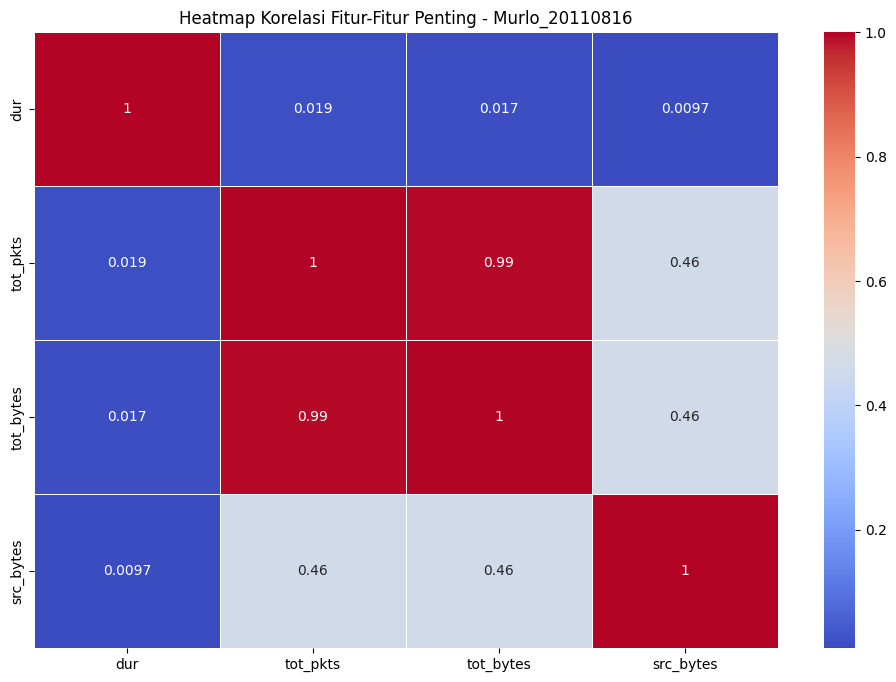


Deskripsi Korelasi Fitur - Murlo_20110816:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.019013   0.016694   0.009678
tot_pkts   0.019013  1.000000   0.994532   0.459990
tot_bytes  0.016694  0.994532   1.000000   0.459501
src_bytes  0.009678  0.459990   0.459501   1.000000


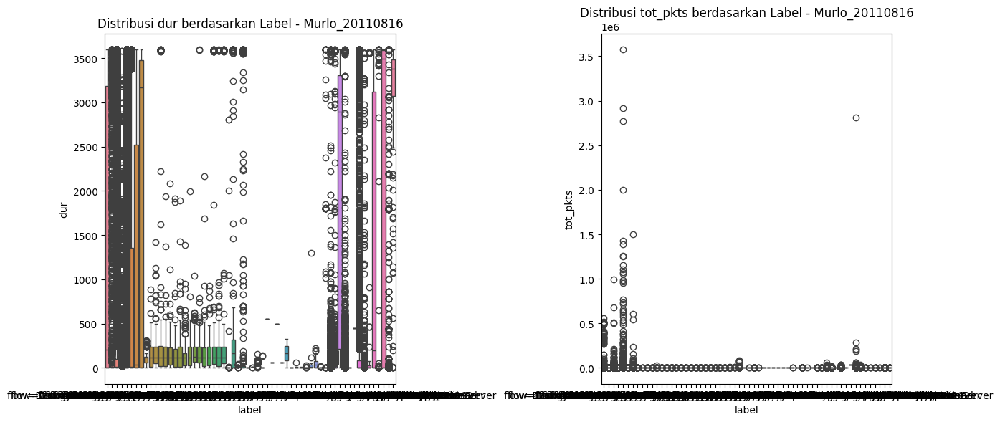


Deskripsi dur dan tot_pkts - Murlo_20110816:
                                                         dur               \
                                                       count         mean   
label                                                                       
flow=Background                                      25387.0  1345.184082   
flow=Background-Attempt-cmpgw-CVUT                    4877.0   413.207184   
flow=Background-Established-cmpgw-CVUT              105972.0   312.414124   
flow=Background-TCP-Attempt                          31942.0   163.786697   
flow=Background-TCP-Established                     273438.0   108.570938   
flow=Background-UDP-Attempt                          55394.0   755.510681   
flow=Background-UDP-Established                     649522.0  1115.094604   
flow=Background-UDP-NTP-Established-1                 6313.0  2337.752197   
flow=Background-ajax.google                            164.0   108.216011   
flow=Background-google-analyti

In [21]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Murlo_20110816["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Murlo_20110816")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Murlo_20110816:")
label_counts = df_Murlo_20110816["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_murlo = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Murlo_20110816, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Murlo_20110816")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Murlo_20110816:")
print(df_Murlo_20110816.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Murlo_20110816[features_of_interest_murlo].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Murlo_20110816")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Murlo_20110816:")
print(df_Murlo_20110816[features_of_interest_murlo].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Murlo_20110816, hue="label")
plt.title("Distribusi dur berdasarkan Label - Murlo_20110816")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Murlo_20110816, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Murlo_20110816")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Murlo_20110816:")
print(df_Murlo_20110816.groupby("label")[["dur", "tot_pkts"]].describe())


In [22]:
# Membaca dataset Neris-20110817 dari file parquet
df_Neris_20110817 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\9-Neris-20110817.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Neris_20110817.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1274632 entries, 0 to 1274631
Data columns (total 11 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   dur        1274632 non-null  float32 
 1   proto      1274632 non-null  category
 2   dir        1274632 non-null  category
 3   state      1274631 non-null  category
 4   stos       1270023 non-null  float32 
 5   dtos       1156462 non-null  float32 
 6   tot_pkts   1274632 non-null  int32   
 7   tot_bytes  1274632 non-null  int64   
 8   src_bytes  1274632 non-null  int32   
 9   label      1274632 non-null  category
 10  Family     1274632 non-null  category
dtypes: category(5), float32(3), int32(2), int64(1)
memory usage: 42.6 MB


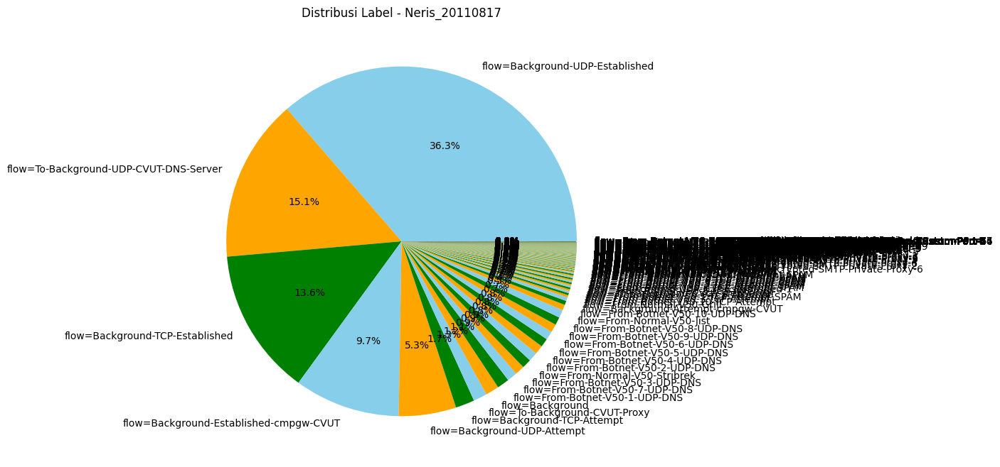

Deskripsi Distribusi Label - Neris_20110817:
flow=Background-UDP-Established                                   463274
flow=To-Background-UDP-CVUT-DNS-Server                            191899
flow=Background-TCP-Established                                   173253
flow=Background-Established-cmpgw-CVUT                            124229
flow=Background-UDP-Attempt                                        67480
                                                                   ...  
flow=From-Botnet-V50-1-TCP-Established-HTTP-Binary-Download-8          1
flow=From-Botnet-V50-8-TCP-HTTP-Not-Encrypted-Down-2                   1
flow=From-Botnet-V50-6-TCP-Established-SSL-To-Microsoft-1              1
flow=From-Botnet-V50-10-UDP-Custom-Encryption-1                        1
flow=From-Botnet-V50-1-TCP-Established-HTTP-Binary-Download-10         1
Name: label, Length: 908, dtype: int64


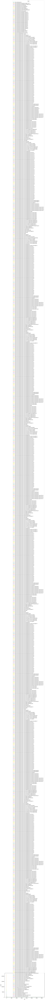


Deskripsi dur - Neris_20110817:
                                           count         mean          std  \
label                                                                        
flow=Background                          15681.0  1256.068115  1491.238525   
flow=Background-Attempt-cmpgw-CVUT        4908.0   490.919312  1062.741699   
flow=Background-Established-cmpgw-CVUT  124229.0   315.745941   858.673218   
flow=Background-TCP-Attempt              22298.0     8.196796    56.377678   
flow=Background-TCP-Established         173253.0    96.034714   416.357635   
...                                          ...          ...          ...   
flow=To-Background-Jist                     32.0  2084.237793  1668.210205   
flow=To-Background-MatLab-Server           341.0    64.849388   465.207855   
flow=To-Background-Stribrek                 25.0  2225.923828  1647.147095   
flow=To-Background-UDP-CVUT-DNS-Server  191899.0     2.150138    82.164047   
flow=To-Normal-V50-UDP-NTP-serv

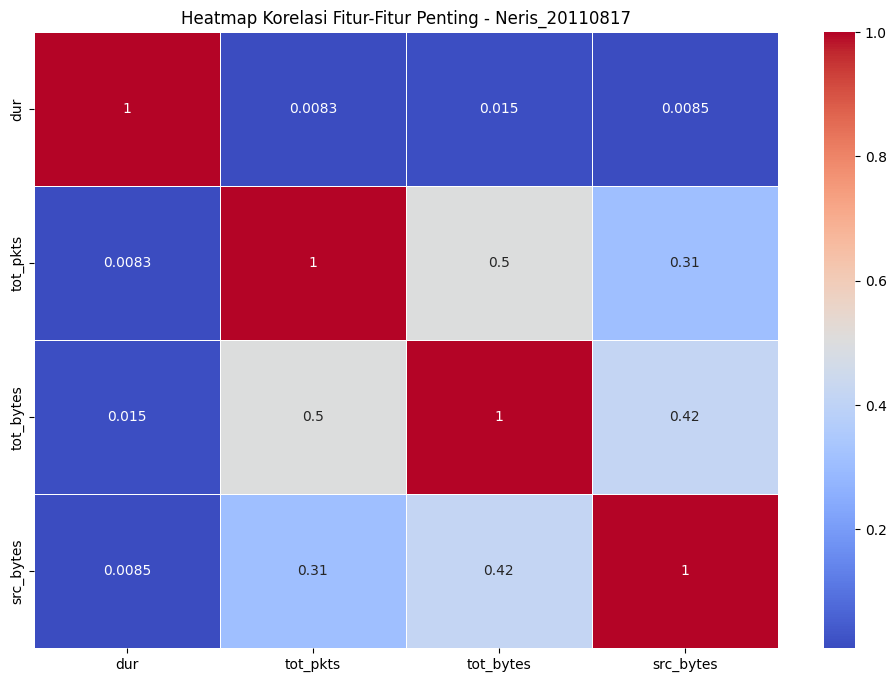


Deskripsi Korelasi Fitur - Neris_20110817:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.008271   0.014508   0.008492
tot_pkts   0.008271  1.000000   0.503247   0.308330
tot_bytes  0.014508  0.503247   1.000000   0.417103
src_bytes  0.008492  0.308330   0.417103   1.000000


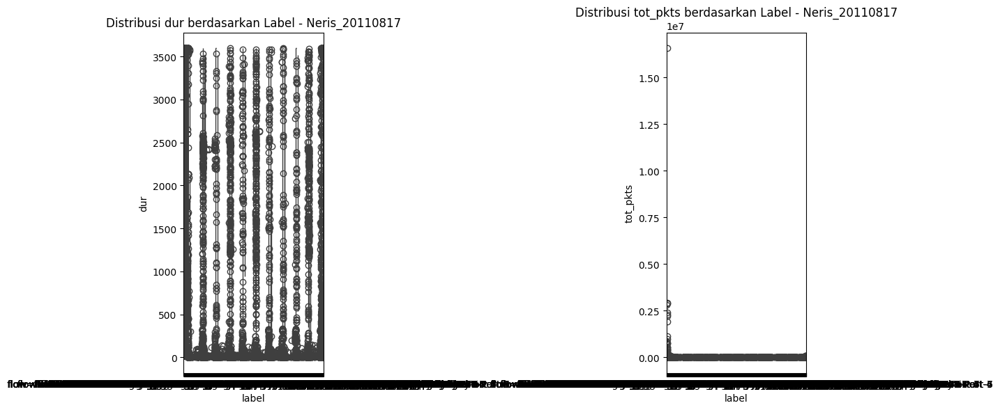


Deskripsi dur dan tot_pkts - Neris_20110817:
                                             dur                            \
                                           count         mean          std   
label                                                                        
flow=Background                          15681.0  1256.068115  1491.238525   
flow=Background-Attempt-cmpgw-CVUT        4908.0   490.919312  1062.741699   
flow=Background-Established-cmpgw-CVUT  124229.0   315.745941   858.673218   
flow=Background-TCP-Attempt              22298.0     8.196796    56.377678   
flow=Background-TCP-Established         173253.0    96.034714   416.357635   
...                                          ...          ...          ...   
flow=To-Background-Jist                     32.0  2084.237793  1668.210205   
flow=To-Background-MatLab-Server           341.0    64.849388   465.207855   
flow=To-Background-Stribrek                 25.0  2225.923828  1647.147095   
flow=To-Background

In [23]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Neris_20110817["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Neris_20110817")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Neris_20110817:")
label_counts = df_Neris_20110817["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_neris = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Neris_20110817, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Neris_20110817")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Neris_20110817:")
print(df_Neris_20110817.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Neris_20110817[features_of_interest_neris].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Neris_20110817")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Neris_20110817:")
print(df_Neris_20110817[features_of_interest_neris].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Neris_20110817, hue="label")
plt.title("Distribusi dur berdasarkan Label - Neris_20110817")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Neris_20110817, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Neris_20110817")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Neris_20110817:")
print(df_Neris_20110817.groupby("label")[["dur", "tot_pkts"]].describe())


In [24]:
# Membaca dataset Rbot-20110818 dari file parquet
df_Rbot_20110818 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\10-Rbot-20110818.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Rbot_20110818.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776097 entries, 0 to 776096
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   dur        776097 non-null  float32 
 1   proto      776097 non-null  category
 2   dir        776097 non-null  category
 3   state      776031 non-null  category
 4   stos       767090 non-null  float32 
 5   dtos       722004 non-null  float32 
 6   tot_pkts   776097 non-null  int32   
 7   tot_bytes  776097 non-null  int32   
 8   src_bytes  776097 non-null  int32   
 9   label      776097 non-null  category
 10  Family     776097 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 22.2 MB


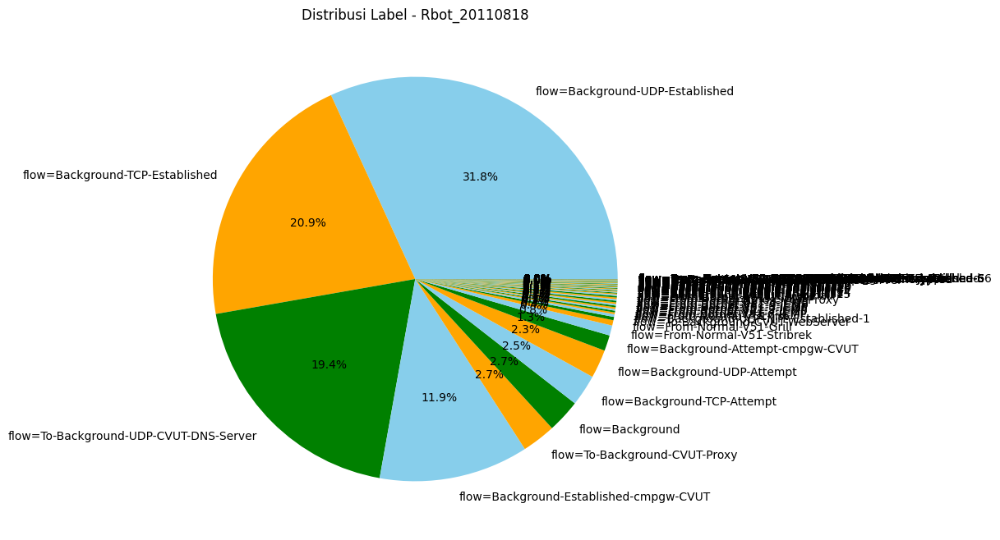

Deskripsi Distribusi Label - Rbot_20110818:
flow=Background-UDP-Established                      247017
flow=Background-TCP-Established                      162510
flow=To-Background-UDP-CVUT-DNS-Server               150702
flow=Background-Established-cmpgw-CVUT                92559
flow=To-Background-CVUT-Proxy                         20900
                                                      ...  
flow=From-Botnet-V51-5-TCP-Established-HTTP-Ad-62         1
flow=From-Botnet-V51-6-TCP-WEB-Established                1
flow=From-Botnet-V51-2-TCP-WEB-Established                1
flow=From-Botnet-V51-9-TCP-CC1-HTTP-Not-Encrypted         1
flow=From-Botnet-V51-8-TCP-Established                    1
Name: label, Length: 111, dtype: int64


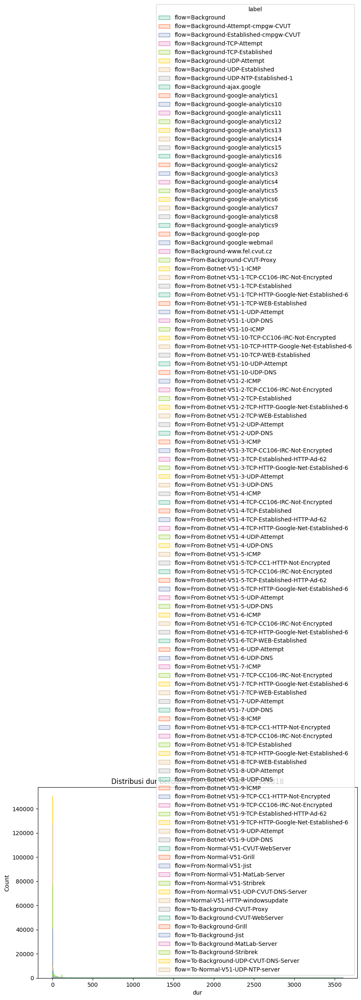


Deskripsi dur - Rbot_20110818:
                                           count         mean          std  \
label                                                                        
flow=Background                          20612.0  1039.674561  1272.441162   
flow=Background-Attempt-cmpgw-CVUT        9752.0   315.016144   843.624939   
flow=Background-Established-cmpgw-CVUT   92559.0   211.180023   671.258423   
flow=Background-TCP-Attempt              19450.0    10.925817    97.263145   
flow=Background-TCP-Established         162510.0    98.063393   422.717743   
...                                          ...          ...          ...   
flow=To-Background-Jist                     38.0  1074.979370  1438.709839   
flow=To-Background-MatLab-Server           313.0    58.401821   425.802673   
flow=To-Background-Stribrek                 62.0  1231.374268  1563.846924   
flow=To-Background-UDP-CVUT-DNS-Server  150702.0     2.635807    89.039078   
flow=To-Normal-V51-UDP-NTP-serve

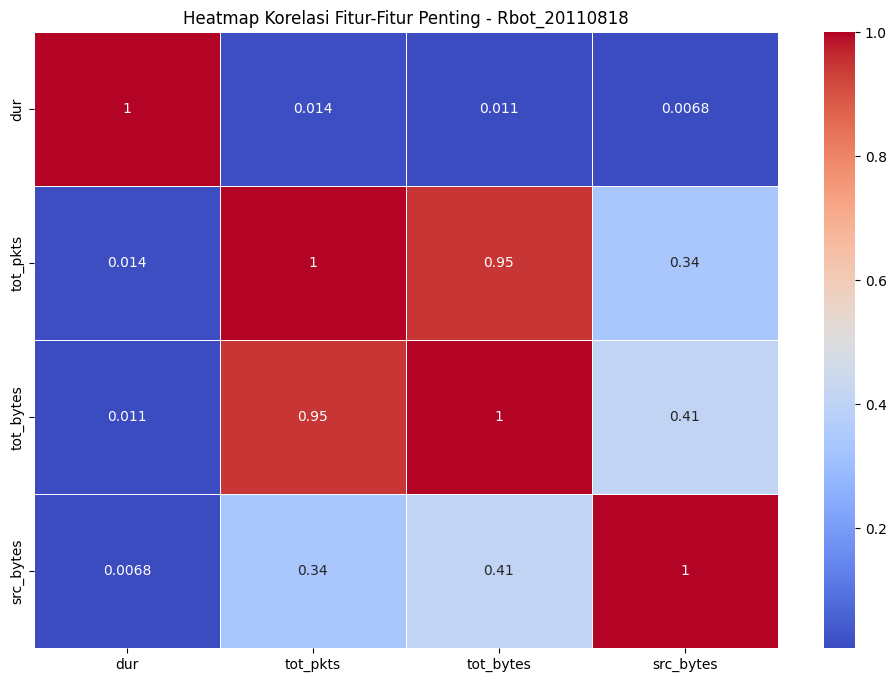


Deskripsi Korelasi Fitur - Rbot_20110818:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.014003   0.010521   0.006811
tot_pkts   0.014003  1.000000   0.947264   0.335429
tot_bytes  0.010521  0.947264   1.000000   0.407215
src_bytes  0.006811  0.335429   0.407215   1.000000


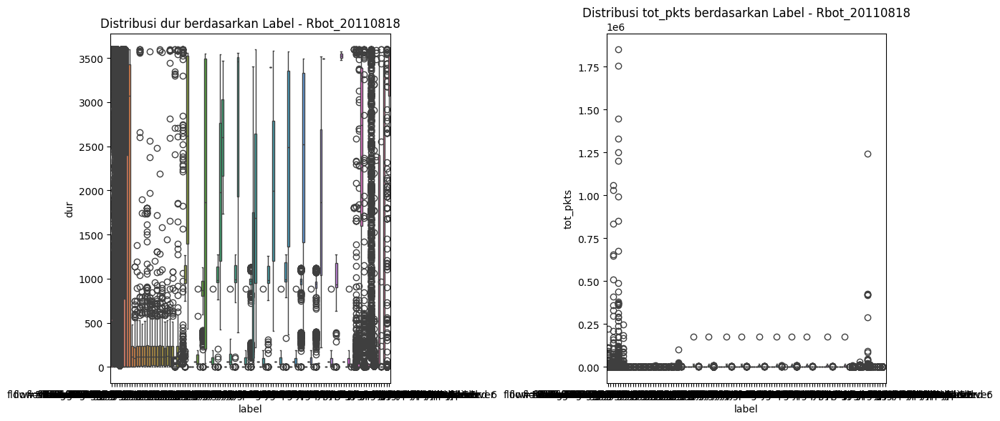


Deskripsi dur dan tot_pkts - Rbot_20110818:
                                             dur                            \
                                           count         mean          std   
label                                                                        
flow=Background                          20612.0  1039.674561  1272.441162   
flow=Background-Attempt-cmpgw-CVUT        9752.0   315.016144   843.624939   
flow=Background-Established-cmpgw-CVUT   92559.0   211.180023   671.258423   
flow=Background-TCP-Attempt              19450.0    10.925817    97.263145   
flow=Background-TCP-Established         162510.0    98.063393   422.717743   
...                                          ...          ...          ...   
flow=To-Background-Jist                     38.0  1074.979370  1438.709839   
flow=To-Background-MatLab-Server           313.0    58.401821   425.802673   
flow=To-Background-Stribrek                 62.0  1231.374268  1563.846924   
flow=To-Background-

In [25]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Rbot_20110818["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Rbot_20110818")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Rbot_20110818:")
label_counts = df_Rbot_20110818["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_rbot = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Rbot_20110818, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Rbot_20110818")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Rbot_20110818:")
print(df_Rbot_20110818.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Rbot_20110818[features_of_interest_rbot].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Rbot_20110818")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Rbot_20110818:")
print(df_Rbot_20110818[features_of_interest_rbot].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Rbot_20110818, hue="label")
plt.title("Distribusi dur berdasarkan Label - Rbot_20110818")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Rbot_20110818, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Rbot_20110818")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Rbot_20110818:")
print(df_Rbot_20110818.groupby("label")[["dur", "tot_pkts"]].describe())


In [27]:
# Membaca dataset Rbot-20110818-2 dari file parquet
df_Rbot_20110818_2 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\11-Rbot-20110818-2.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Rbot_20110818_2.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72359 entries, 0 to 72358
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   dur        72359 non-null  float32 
 1   proto      72359 non-null  category
 2   dir        72359 non-null  category
 3   state      72356 non-null  category
 4   stos       71496 non-null  float32 
 5   dtos       66968 non-null  float32 
 6   tot_pkts   72359 non-null  int32   
 7   tot_bytes  72359 non-null  int32   
 8   src_bytes  72359 non-null  int32   
 9   label      72359 non-null  category
 10  Family     72359 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 2.1 MB


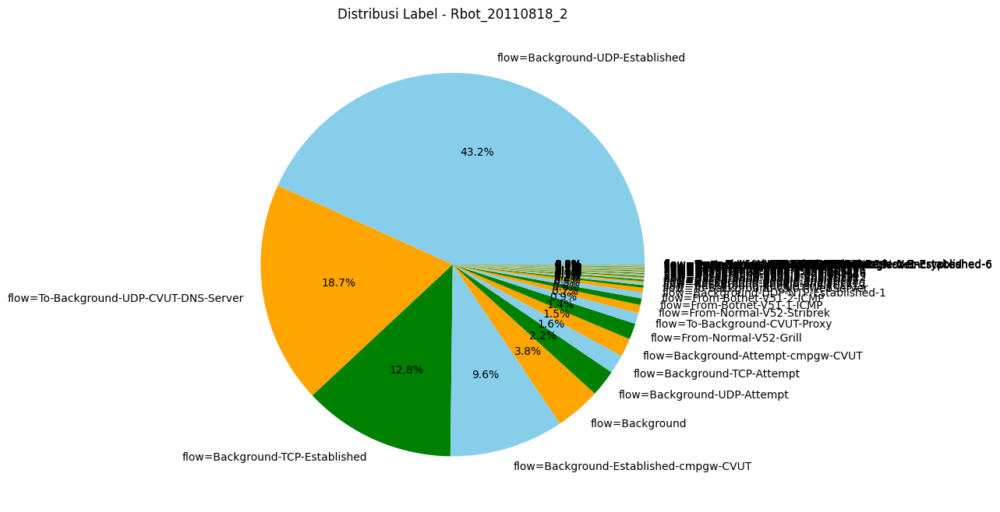

Deskripsi Distribusi Label - Rbot_20110818_2:
flow=Background-UDP-Established                             31288
flow=To-Background-UDP-CVUT-DNS-Server                      13549
flow=Background-TCP-Established                              9292
flow=Background-Established-cmpgw-CVUT                       6966
flow=Background                                              2768
flow=Background-UDP-Attempt                                  1623
flow=Background-TCP-Attempt                                  1155
flow=Background-Attempt-cmpgw-CVUT                           1119
flow=From-Normal-V52-Grill                                    981
flow=To-Background-CVUT-Proxy                                 658
flow=From-Normal-V52-Stribrek                                 510
flow=From-Botnet-V51-1-ICMP                                   403
flow=From-Botnet-V51-2-ICMP                                   362
flow=Background-UDP-NTP-Established-1                         286
flow=To-Background-CVUT-WebSer

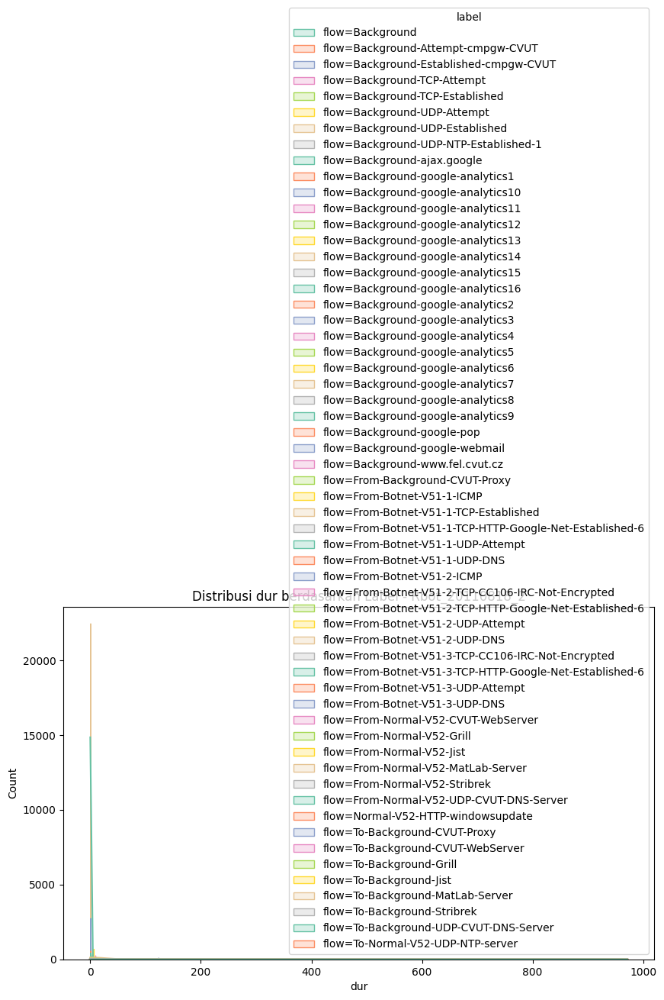


Deskripsi dur - Rbot_20110818_2:
                                                      count        mean  \
label                                                                     
flow=Background                                      2768.0  418.730804   
flow=Background-Attempt-cmpgw-CVUT                   1119.0   76.874092   
flow=Background-Established-cmpgw-CVUT               6966.0   79.375557   
flow=Background-TCP-Attempt                          1155.0    5.290526   
flow=Background-TCP-Established                      9292.0   41.043938   
flow=Background-UDP-Attempt                          1623.0  115.133781   
flow=Background-UDP-Established                     31288.0   83.638954   
flow=Background-UDP-NTP-Established-1                 286.0  411.481262   
flow=Background-ajax.google                            14.0  135.482513   
flow=Background-google-analytics1                      40.0   79.455902   
flow=Background-google-analytics10                    103.0   92.4

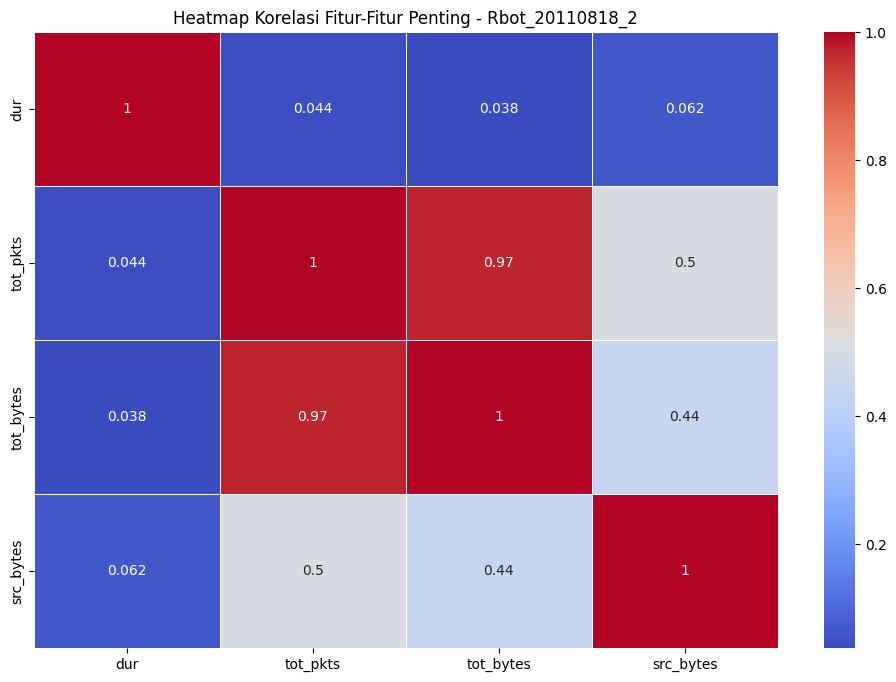


Deskripsi Korelasi Fitur - Rbot_20110818_2:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.044183   0.037726   0.062425
tot_pkts   0.044183  1.000000   0.970481   0.503825
tot_bytes  0.037726  0.970481   1.000000   0.442053
src_bytes  0.062425  0.503825   0.442053   1.000000


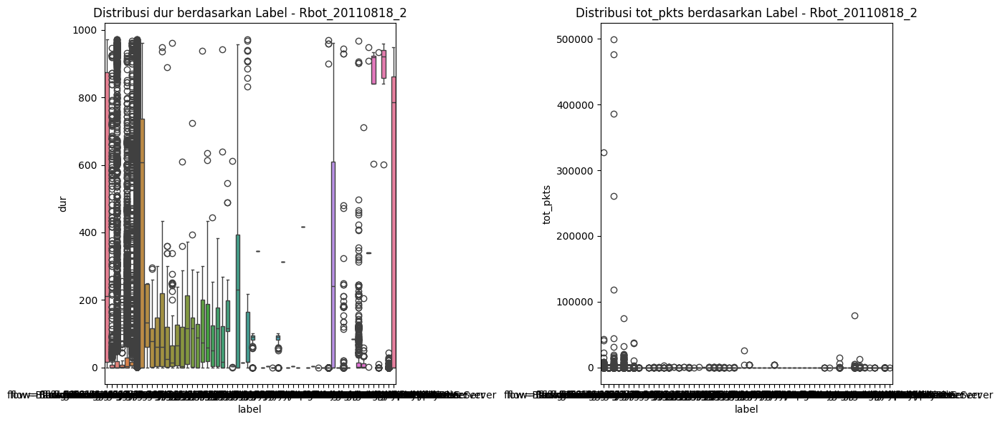


Deskripsi dur dan tot_pkts - Rbot_20110818_2:
                                                        dur              \
                                                      count        mean   
label                                                                     
flow=Background                                      2768.0  418.730804   
flow=Background-Attempt-cmpgw-CVUT                   1119.0   76.874092   
flow=Background-Established-cmpgw-CVUT               6966.0   79.375557   
flow=Background-TCP-Attempt                          1155.0    5.290526   
flow=Background-TCP-Established                      9292.0   41.043938   
flow=Background-UDP-Attempt                          1623.0  115.133781   
flow=Background-UDP-Established                     31288.0   83.638954   
flow=Background-UDP-NTP-Established-1                 286.0  411.481262   
flow=Background-ajax.google                            14.0  135.482513   
flow=Background-google-analytics1                    

In [28]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Rbot_20110818_2["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Rbot_20110818_2")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Rbot_20110818_2:")
label_counts = df_Rbot_20110818_2["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_rbot = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Rbot_20110818_2, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Rbot_20110818_2")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Rbot_20110818_2:")
print(df_Rbot_20110818_2.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Rbot_20110818_2[features_of_interest_rbot].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Rbot_20110818_2")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Rbot_20110818_2:")
print(df_Rbot_20110818_2[features_of_interest_rbot].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Rbot_20110818_2, hue="label")
plt.title("Distribusi dur berdasarkan Label - Rbot_20110818_2")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Rbot_20110818_2, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Rbot_20110818_2")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Rbot_20110818_2:")
print(df_Rbot_20110818_2.groupby("label")[["dur", "tot_pkts"]].describe())


In [30]:
# Membaca dataset NsisAy-20110819 dari file parquet
df_NsisAy_20110819 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\12-NsisAy-20110819.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_NsisAy_20110819.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218917 entries, 0 to 218916
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   dur        218917 non-null  float32 
 1   proto      218917 non-null  category
 2   dir        218917 non-null  category
 3   state      218917 non-null  category
 4   stos       217623 non-null  float32 
 5   dtos       206626 non-null  float32 
 6   tot_pkts   218917 non-null  int32   
 7   tot_bytes  218917 non-null  int32   
 8   src_bytes  218917 non-null  int32   
 9   label      218917 non-null  category
 10  Family     218917 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 6.3 MB


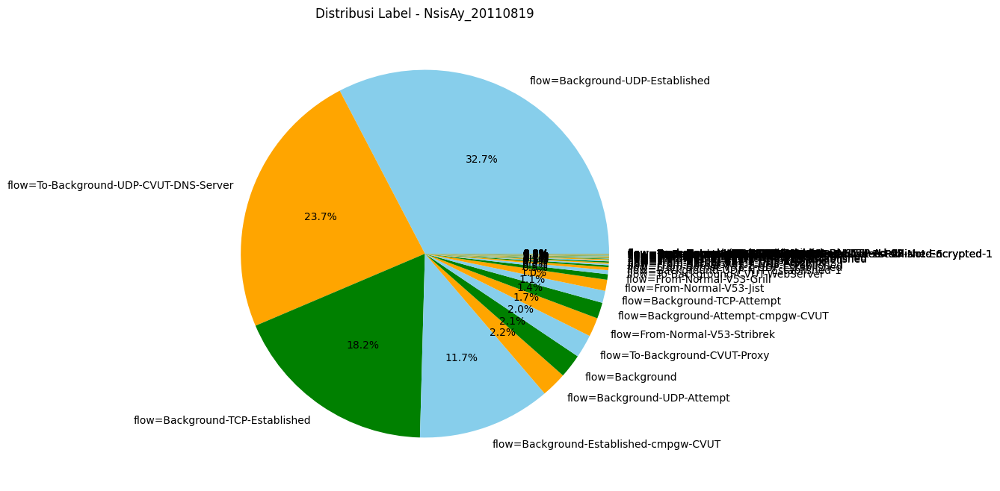

Deskripsi Distribusi Label - NsisAy_20110819:
flow=Background-UDP-Established                      71491
flow=To-Background-UDP-CVUT-DNS-Server               51991
flow=Background-TCP-Established                      39761
flow=Background-Established-cmpgw-CVUT               25590
flow=Background-UDP-Attempt                           4876
                                                     ...  
flow=From-Normal-V53-MatLab-Server                       1
flow=Background-google-analytics9                        1
flow=From-Botnet-V51-2-UDP-Attempt-DNS                   1
flow=From-Botnet-V51-3-TCP-Established                   1
flow=From-Botnet-V51-1-TCP-Established-HTTP-Ad-48        1
Name: label, Length: 72, dtype: int64


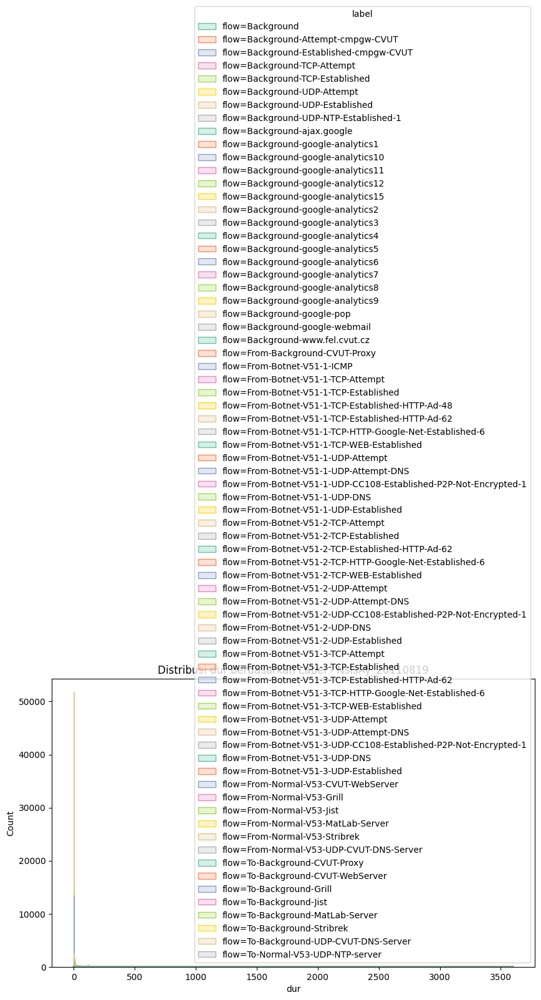


Deskripsi dur - NsisAy_20110819:
                                          count         mean          std  \
label                                                                       
flow=Background                          4577.0  1122.834106  1424.454102   
flow=Background-Attempt-cmpgw-CVUT       3084.0   444.168823   895.215149   
flow=Background-Established-cmpgw-CVUT  25590.0   198.769623   648.558716   
flow=Background-TCP-Attempt              2328.0    11.587770    63.889290   
flow=Background-TCP-Established         39761.0    62.050018   252.238922   
...                                         ...          ...          ...   
flow=To-Background-Jist                     3.0   193.428329   168.487564   
flow=To-Background-MatLab-Server          101.0    41.863396   362.885559   
flow=To-Background-Stribrek                10.0  1156.643921  1553.180786   
flow=To-Background-UDP-CVUT-DNS-Server  51991.0     0.885071    45.739525   
flow=To-Normal-V53-UDP-NTP-server         

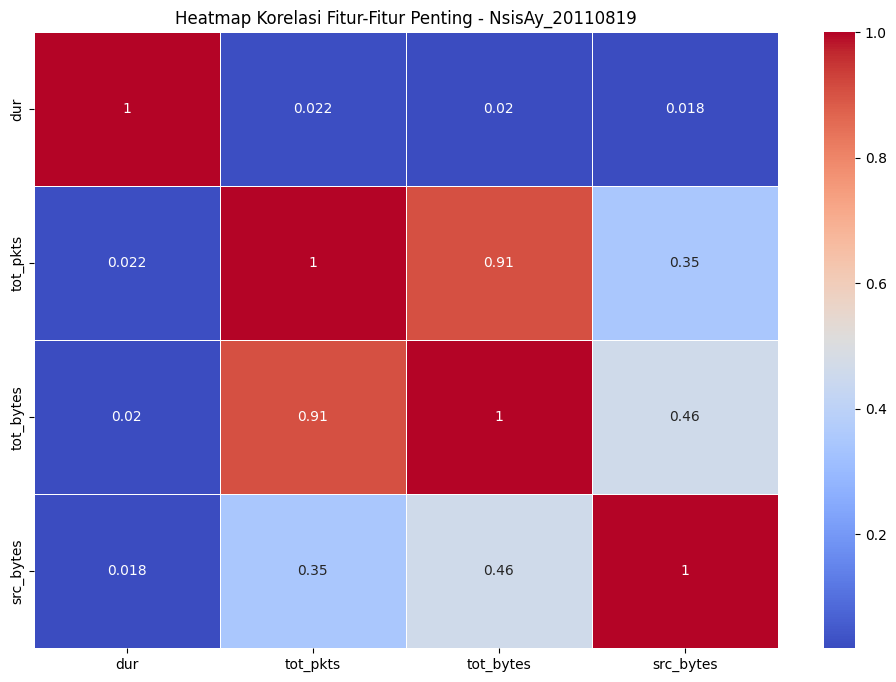


Deskripsi Korelasi Fitur - NsisAy_20110819:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.022302   0.019668   0.018179
tot_pkts   0.022302  1.000000   0.905677   0.347270
tot_bytes  0.019668  0.905677   1.000000   0.460095
src_bytes  0.018179  0.347270   0.460095   1.000000


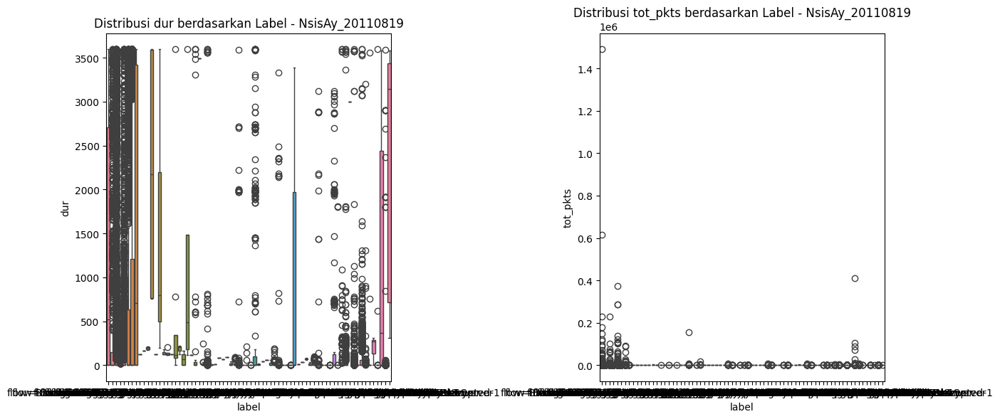


Deskripsi dur dan tot_pkts - NsisAy_20110819:
                                            dur                            \
                                          count         mean          std   
label                                                                       
flow=Background                          4577.0  1122.834106  1424.454102   
flow=Background-Attempt-cmpgw-CVUT       3084.0   444.168823   895.215149   
flow=Background-Established-cmpgw-CVUT  25590.0   198.769623   648.558716   
flow=Background-TCP-Attempt              2328.0    11.587770    63.889290   
flow=Background-TCP-Established         39761.0    62.050018   252.238922   
...                                         ...          ...          ...   
flow=To-Background-Jist                     3.0   193.428329   168.487564   
flow=To-Background-MatLab-Server          101.0    41.863396   362.885559   
flow=To-Background-Stribrek                10.0  1156.643921  1553.180786   
flow=To-Background-UDP-CVUT-D

In [31]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_NsisAy_20110819["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - NsisAy_20110819")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - NsisAy_20110819:")
label_counts = df_NsisAy_20110819["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_nsis = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_NsisAy_20110819, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - NsisAy_20110819")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - NsisAy_20110819:")
print(df_NsisAy_20110819.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_NsisAy_20110819[features_of_interest_nsis].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - NsisAy_20110819")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - NsisAy_20110819:")
print(df_NsisAy_20110819[features_of_interest_nsis].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_NsisAy_20110819, hue="label")
plt.title("Distribusi dur berdasarkan Label - NsisAy_20110819")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_NsisAy_20110819, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - NsisAy_20110819")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - NsisAy_20110819:")
print(df_NsisAy_20110819.groupby("label")[["dur", "tot_pkts"]].describe())


In [33]:
# Membaca dataset Virut-20110815-3 dari file parquet
df_Virut_20110815_3 = pd.read_parquet("C:\\Data Raihan\\Penelitian Threshold\\Dataset\\CTU-13\\13-Virut-20110815-3.binetflow.parquet")

# Menampilkan informasi lengkap dari DataFrame
df_Virut_20110815_3.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 975616 entries, 0 to 975615
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   dur        975616 non-null  float32 
 1   proto      975616 non-null  category
 2   dir        975616 non-null  category
 3   state      975615 non-null  category
 4   stos       965898 non-null  float32 
 5   dtos       901520 non-null  float32 
 6   tot_pkts   975616 non-null  int32   
 7   tot_bytes  975616 non-null  int32   
 8   src_bytes  975616 non-null  int32   
 9   label      975616 non-null  category
 10  Family     975616 non-null  category
dtypes: category(5), float32(3), int32(3)
memory usage: 27.9 MB


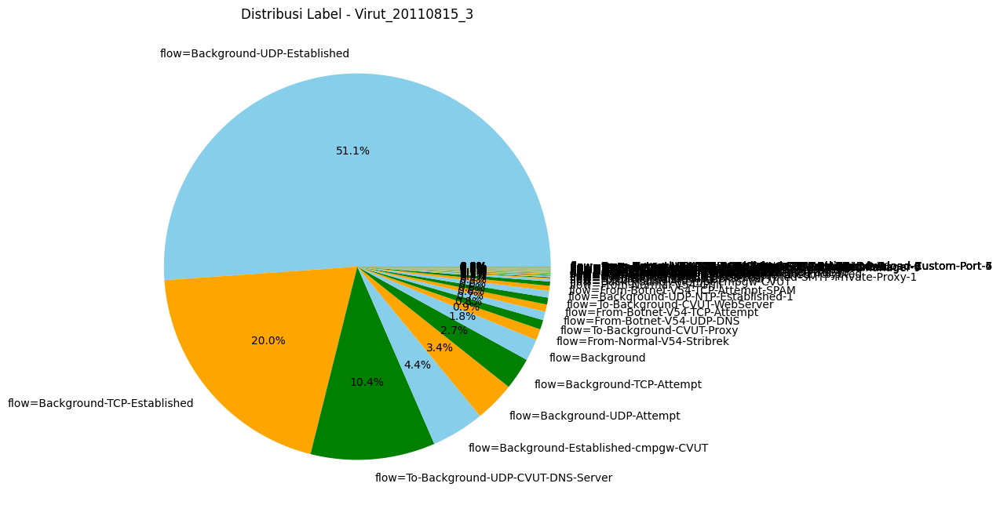

Deskripsi Distribusi Label - Virut_20110815_3:
flow=Background-UDP-Established                                            498735
flow=Background-TCP-Established                                            194986
flow=To-Background-UDP-CVUT-DNS-Server                                     101569
flow=Background-Established-cmpgw-CVUT                                      43135
flow=Background-UDP-Attempt                                                 32865
                                                                            ...  
flow=From-Botnet-V54-TCP-Established-HTTP-Ad-42                                 2
flow=From-Botnet-V54-TCP-Established-HTTP-Binary-Download-Custom-Port-7         1
flow=From-Botnet-V54-TCP-Established-HTTP-Ad-33                                 1
flow=From-Botnet-V54-TCP-Established-HTTP-Ad-49                                 1
flow=From-Botnet-V54-TCP-Established-HTTP-Ad-63                                 1
Name: label, Length: 115, dtype: int64


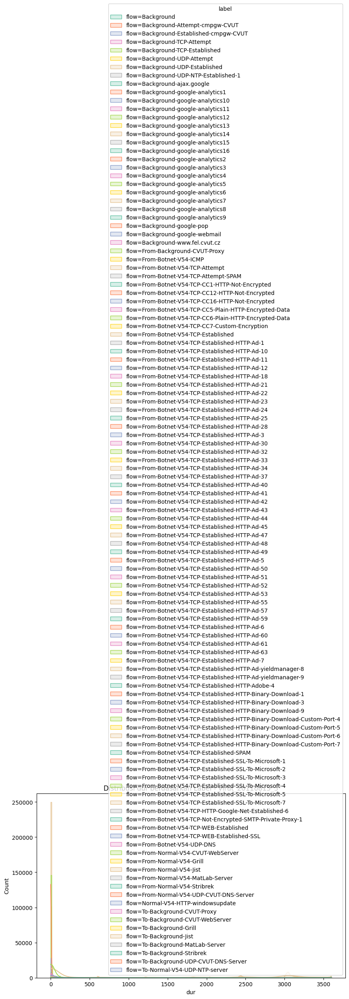


Deskripsi dur - Virut_20110815_3:
                                           count         mean          std  \
label                                                                        
flow=Background                          17658.0  1351.832397  1560.422729   
flow=Background-Attempt-cmpgw-CVUT        1877.0   312.836334   843.611450   
flow=Background-Established-cmpgw-CVUT   43135.0   118.233231   480.873260   
flow=Background-TCP-Attempt              26174.0    16.814070   144.316452   
flow=Background-TCP-Established         194986.0   110.138687   489.701508   
...                                          ...          ...          ...   
flow=To-Background-Jist                     14.0     1.072235     1.492858   
flow=To-Background-MatLab-Server           739.0    86.374458   526.500488   
flow=To-Background-Stribrek                 72.0  1852.180176  1716.529907   
flow=To-Background-UDP-CVUT-DNS-Server  101569.0     0.710178    37.125401   
flow=To-Normal-V54-UDP-NTP-se

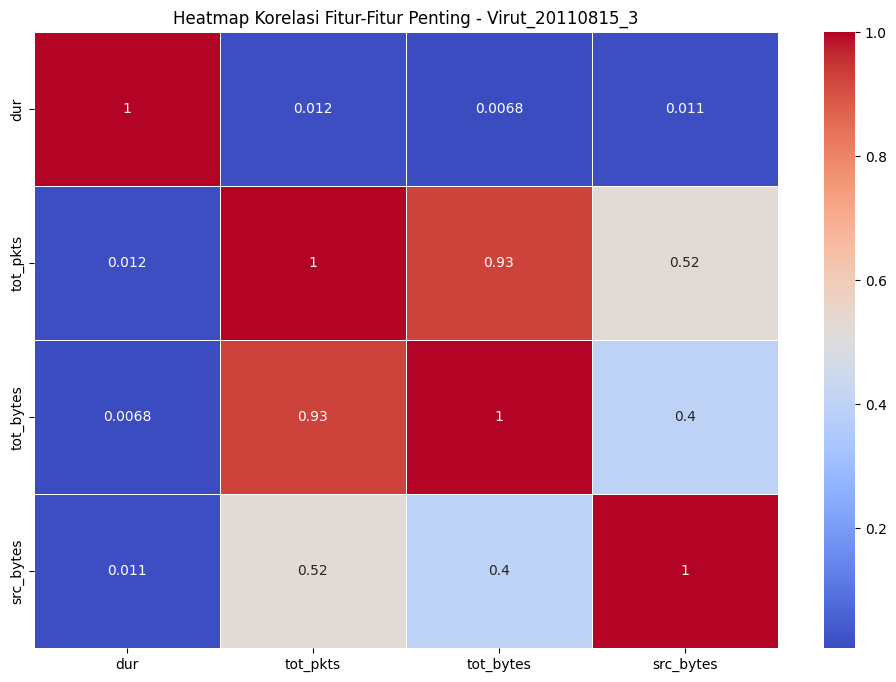


Deskripsi Korelasi Fitur - Virut_20110815_3:
                dur  tot_pkts  tot_bytes  src_bytes
dur        1.000000  0.011956   0.006783   0.011447
tot_pkts   0.011956  1.000000   0.927008   0.524312
tot_bytes  0.006783  0.927008   1.000000   0.398465
src_bytes  0.011447  0.524312   0.398465   1.000000


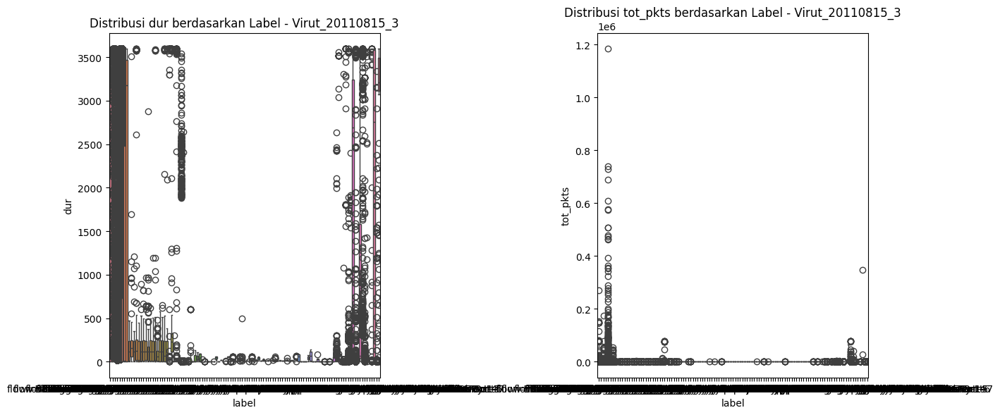


Deskripsi dur dan tot_pkts - Virut_20110815_3:
                                             dur                            \
                                           count         mean          std   
label                                                                        
flow=Background                          17658.0  1351.832397  1560.422729   
flow=Background-Attempt-cmpgw-CVUT        1877.0   312.836334   843.611450   
flow=Background-Established-cmpgw-CVUT   43135.0   118.233231   480.873260   
flow=Background-TCP-Attempt              26174.0    16.814070   144.316452   
flow=Background-TCP-Established         194986.0   110.138687   489.701508   
...                                          ...          ...          ...   
flow=To-Background-Jist                     14.0     1.072235     1.492858   
flow=To-Background-MatLab-Server           739.0    86.374458   526.500488   
flow=To-Background-Stribrek                 72.0  1852.180176  1716.529907   
flow=To-Backgrou

In [34]:
# Visualisasi Distribusi Label
plt.figure(figsize=(8, 8))
df_Virut_20110815_3["label"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=['skyblue', 'orange', 'green'])
plt.title("Distribusi Label - Virut_20110815_3")
plt.ylabel("")  # Menghilangkan label y agar lebih bersih
plt.show()

# Deskripsi Singkat Tentang Distribusi Label
print("Deskripsi Distribusi Label - Virut_20110815_3:")
label_counts = df_Virut_20110815_3["label"].value_counts()
print(label_counts)

# Pilih fitur-fitur penting untuk analisis lebih lanjut (misalnya, 'dur', 'tot_pkts', 'tot_bytes', 'src_bytes')
features_of_interest_virut = ["dur", "tot_pkts", "tot_bytes", "src_bytes"]

# Visualisasi Distribusi dur berdasarkan Label
plt.figure(figsize=(10, 6))
sns.histplot(df_Virut_20110815_3, x="dur", hue="label", element="step", palette="Set2", kde=True)
plt.title("Distribusi dur berdasarkan Label - Virut_20110815_3")
plt.xlabel("dur")
plt.ylabel("Count")
plt.show()

# Deskripsi Singkat Tentang dur
print("\nDeskripsi dur - Virut_20110815_3:")
print(df_Virut_20110815_3.groupby("label")["dur"].describe())

# Heatmap Korelasi Fitur-Fitur Penting
plt.figure(figsize=(12, 8))
sns.heatmap(df_Virut_20110815_3[features_of_interest_virut].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Korelasi Fitur-Fitur Penting - Virut_20110815_3")
plt.show()

# Deskripsi Singkat Tentang Korelasi Fitur-Fitur Penting
print("\nDeskripsi Korelasi Fitur - Virut_20110815_3:")
print(df_Virut_20110815_3[features_of_interest_virut].corr())

# Visualisasi Boxplot untuk Distribusi dur dan tot_pkts
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x="label", y="dur", data=df_Virut_20110815_3, hue="label")
plt.title("Distribusi dur berdasarkan Label - Virut_20110815_3")

plt.subplot(1, 2, 2)
sns.boxplot(x="label", y="tot_pkts", data=df_Virut_20110815_3, hue="label")
plt.title("Distribusi tot_pkts berdasarkan Label - Virut_20110815_3")

plt.tight_layout()
plt.show()

# Deskripsi Singkat Tentang Distribusi dur dan tot_pkts
print("\nDeskripsi dur dan tot_pkts - Virut_20110815_3:")
print(df_Virut_20110815_3.groupby("label")[["dur", "tot_pkts"]].describe())
